In [1]:
## fonctions de base

#packages

using Pkg
#Pkg.add("LinearAlgebra")
#Pkg.add("LinearSolve")
#Pkg.add("Plots")
#Pkg.add("Printf")
#Pkg.add("LaTeXStrings")
#Pkg.add("Interpolations")
#Pkg.add("NPZ")


using LinearAlgebra
using LinearSolve
using Plots
using LaTeXStrings
using Interpolations
using NPZ
using Printf


#-------------------------------------------------------------------------------------
#	dressing of function f (given as array f_discr, occupation ratio given as n_discr)
#-------------------------------------------------------------------------------------


function f_varphimat(lam_discr,gb)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)
    return varphimat
end 

function f_dlam(lam_discr)
    L = size(lam_discr)[1]
    dlam = zeros(L)
    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    return dlam
end
    
function dress(gb, lam_discr, n_discr, f_discr)
    
    
    varphimat = f_varphimat(lam_discr,gb)
    dlam = f_dlam(lam_discr)
    
    A = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    A\f_discr
end

#-------------------------------------------------------------------------------------
#	to evaluate charge density associated with function f
#-------------------------------------------------------------------------------------

function charge_density(gb, lam_discr, n_discr, f_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    A = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    0.5/pi * dot(dlam , Diagonal(n_discr) * (A \ f_discr) )
end

#-------------------------------------------------------------------------
#	solve Yang-Yang equation
#-------------------------------------------------------------------------

function fun1(z)
    if z>0
        return log(1. +exp(-z))
    else
        return log(1. +exp(z)) - z
    end
end

function fun2(z)
    if z<0
        return 1. /(1. +exp(z))
    else
        return exp(-z)/(1. +exp(-z))
    end
end

function yangyang(gb, beta, lam_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])

    bare_E = 0.5 * beta[3] * lam_discr.^2 + beta[2] * lam_discr + beta[1] * ones(L)
    eps = copy(bare_E)
    n = fun2.(eps)

    #iterative solution
    diff = 1.
    while diff>1e-12
        old_n = copy(n)
        eps = bare_E - 0.5/pi * varphimat*Diagonal( fun1.(eps) )*dlam
        n = fun2.(eps)
        diff = norm(n-old_n)
    end
    eps = bare_E - 0.5/pi * varphimat*Diagonal( fun1.(eps) )*dlam
    n = fun2.(eps)
    return n
end

#-------------------------------------------------------------------------------------
#	compute effective velocity
#-------------------------------------------------------------------------------------

function veff(gb, lam_discr, n_discr)
    L = size(lam_discr)[1]
    varphi(lam) = 2*gb/( gb^2 + lam^2 )
    varphimat = zeros(L,L)
    dlam = zeros(L)

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( lam_discr[i]-lam_discr[j] )
            varphimat[j,i] = varphi( lam_discr[i]-lam_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)

    for i = 2:L-1
        dlam[i] = 0.5*(lam_discr[i+1]-lam_discr[i-1])
    end
    dlam[1] = 0.5*(lam_discr[2]-lam_discr[1])
    dlam[L] = 0.5*(lam_discr[L]-lam_discr[L-1])
    dresser = I - 0.5/pi * varphimat*Diagonal(n_discr)*Diagonal(dlam)
    onedr = dresser\ones(L)
    iddr = dresser\copy(lam_discr)
    iddr ./ onedr
end



veff (generic function with 1 method)

In [2]:
function DeltaMat(theta_discr , gbar )
    L = size(theta_discr)[1]
    varphi(theta) = 2*gbar/( gbar^2 + theta^2 )
    varphimat = zeros(L,L)
    

    for i = 1:L
        for j = 1:i
            varphimat[i,j] = varphi( theta_discr[i]-theta_discr[j] )
            varphimat[j,i] = varphi( theta_discr[i]-theta_discr[j] )
        end
    end
    varphimat = Symmetric(varphimat)
    return varphimat
end 

function Delta(theta_discr)
    L = size(theta_discr)[1]
    dtheta = zeros(L)
        
    for i = 2:L-1
        dtheta[i] = 0.5*(theta_discr[i+1]-theta_discr[i-1])
    end
    dtheta[1] = 0.5*(theta_discr[2]-theta_discr[1])
    dtheta[L] = 0.5*(theta_discr[L]-theta_discr[L-1])
    
    return dtheta
end 

function montrer_les_rho(theta_discr, nu_discr)
    L = length(theta_discr)
    
    varphimat = DeltaMat(theta_discr , gbar)
    dtheta = Delta(theta_discr)
    
    # Plot nu_tilde
    p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="f", legend=:topright)
    plot!(p , theta_discr , nu_discr, label="\$\\tilde{\\nu}\$")
    # Méthode 0
    rho_s_0 = 0.5 / pi * dress(gbar , theta_discr, nu_discr, ones(L))
    rho_0 = nu_discr .* rho_s_0
    
    # Méthode 1
    Mat_F_1 = I - (1 / (2 * pi)) * Diagonal(dtheta) * Diagonal(nu_discr) * varphimat
    B = (1 / (2 * pi)) * nu_discr
    rho_1 = Mat_F_1 \ B
    rho_s_1 = rho_1 ./ nu_discr

    # Méthode 2
    Mat_F_2 = I - 0.5 / pi * varphimat * Diagonal(nu_discr) * Diagonal(dtheta)
    B = (1 / (2 * pi)) * ones(L)
    rho_s_2 = Mat_F_2 \ B
    rho_2 = nu_discr .* rho_s_2
    
    # Plot résultats de la méthode 0
    plot!(p, theta_discr, rho_s_0, label="Meth 0 : \$\\tilde{\\rho_s}= \\frac{1}{2\\pi}\\\$")
    plot!(p, theta_discr, rho_0, label="Meth 0 : \$\\tilde{\\rho} = \\tilde{\\nu} * \\tilde{\\rho_s}\$")
    
    # Plot résultats de la méthode 1
    plot!(p, theta_discr, rho_1, label="Meth 1 : \$\\tilde{\\rho}= \\frac{\\tilde{\\nu}}{2\\pi} ( 1 + \\tilde{\\Delta} * \\tilde{\\rho}) \$")
    plot!(p, theta_discr, rho_s_1, label="Meth 1 : \$\\tilde{\\rho}_s  = \\frac{\\tilde{\\rho}}{\\tilde{\\nu}}  \$")
    
    # Plot résultats de la méthode 2
    plot!(p, theta_discr, rho_s_2, label="Meth 2 : \$\\tilde{\\rho_s}= \\frac{1}{2\\pi}\$")
    plot!(p, theta_discr, rho_2, label="Meth 2 : \$\\tilde{\\rho} = \\tilde{\\nu} * \\tilde{\\rho_s}\$")

    display(p)
    
    #p1 = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="\$\\Delta\$", legend=:topright)

    # Plot des différences entre les résultats des deux méthodes
    #plot(p1,theta_discr, rho_s_1 - rho_s_2, label="\$ \\Delta \\tilde{\\rho_s}\$")
    #plot(p1,theta_discr, rho_1 - rho_2, label="\$\\Delta \\tilde{\\rho}\$")

    # Légendes et labels
    #display(p1)
end

#-------------------------------------------------------------------------------------
#	theta start
#-------------------------------------------------------------------------------------

using Roots
function find_nu_theta_star_discr( theta_discr , theta_star  , nu_discr )
    return ifelse.(theta_discr .> theta_star, 0, nu_discr)
end 

function find_theta_star(theta_discr, nu_discr ,  gbar)
    
    # Définition de la fonction f_veff_star_theta_star
    f_veff_star_theta_star = theta_star -> linear_interpolation(theta_discr, veff( gbar, theta_discr, find_nu_theta_star_discr(theta_discr, theta_star, nu_discr)))(theta_star)
    
    return fzero(f_veff_star_theta_star, theta_discr[1] , last(theta_discr))
end

find_theta_star (generic function with 1 method)

In [3]:
import Pkg
#Pkg.add("Dates")
using Dates

# Formater la date selon le format spécifié
new_date = Dates.format(Dates.today(), "yyyy-mm-dd")

# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

2025-02-15


In [4]:
new_date = "analyse_2024-11-04"
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)

analyse_2024-11-04


In [5]:
theta_max = 20
npts = 200
theta_discr = LinRange(-theta_max, theta_max , npts) 


#------------------------------------------------------------------------------------------------
#	Fonction pour calculer les nu , rho et rho_s et predire cest fonction apres la coupure 1 
#-
function save_nu_rho_rho_s(new_date , nom , theta_discr, n_p  , mup , T , x0 , Taille , t_deform,  gbar )
    if mup == "None" 
       mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    else 
        n_p = (((mup / (hbar * om_perp)) + 1)^2 - 1) / (4 * a3D)
    end
    # Discrétisation de theta
    beta = [-mup / (kB * T) 0 mass * g^2/(kB * T * hbar^2)]
    beta = [-mup / (kB * T) 0 mass /(kB * T)]

    # Définir la date sous forme de chaîne

    index_last_underscore = findlast(isequal('_'), nom)

    
    filename = @sprintf "%s/theta_discr_%s.npz" new_date nom[index_last_underscore+1:end]
    npzwrite(filename, theta_discr )
    println("saved : ", filename)  

    @time nu_discr = yangyang(gbar, beta, theta_discr)

    filename = @sprintf "%s/nu_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, nu_discr )
    println("saved : ", filename)
    #montrer_les_rho(theta_discr , nu_discr)

    @time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
    filename = @sprintf "%s/rho_s_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_s_discr )
    println("saved : ", filename)

    @time rho_discr = nu_discr .* rho_s_discr
    filename = @sprintf "%s/rho_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, rho_discr )
    println("saved : ", filename)
    
    ## veff de bord j'ai 3 metdode qui donnent la meme foction à voir 
    @time veff_discr = veff( gbar, theta_discr, nu_discr)
    filename = @sprintf "%s/veff_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, veff_discr )
    println("saved : ", filename)
    
        
    #find_nu_theta_star_discr( theta_discr , theta_star  , nu_discr )return ifelse.(theta_discr .> theta_star, 0, nu_discr)
    function f_veff_star_theta_star(theta_star)
        theta_max = last(theta_discr)
        #println(@sprintf "max : %.3f"  maximum(theta_discr))
        #println("mim : " , minimum(theta_discr))    
        if theta_star == -theta_max 
            return -theta_max
        end 
        n_discr_3 = find_nu_theta_star_discr( theta_discr , theta_star  , nu_discr )
        #plot!(p, theta_discr,  n_discr_3, label="n_{$(theta_star)}")
        #plot!(p1, theta_discr,  veff( gbar, theta_discr, n_discr_3), label="v_{$(theta_star)}")
        veff_fun = LinearInterpolation(theta_discr,veff( gbar, theta_discr, n_discr_3)  )
        return veff_fun(theta_star)
    end 
        
    
    #println( @sprintf "veff (%.3f) = %.3f" theta_star f_veff_star_theta_star_2(theta_star))
    #veff_discr_2 = [f_veff_star_theta_star_2(theta) for theta in theta_discr]
        
    L = size(theta_discr)[1]    
    veff_discr_4 = zeros(L)
    #p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="n", legend=:topright)
    #p1 = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="veff", legend=:topright)
    for i = 1 : L 
        veff_discr_4[i] = f_veff_star_theta_star(theta_discr[i])
    end 
    #display(p)
    #display(p1)

    
    #@time veff_discr_3 = [theta_star == theta_max ? theta_max : veff(gbar, LinRange(theta_star, theta_max, 600), LinearInterpolation(theta_discr, nu_discr).(LinRange(theta_star, theta_max, 600)))[1] for theta_star in theta_discr]
    filename = @sprintf "%s/veff_bord_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
    npzwrite(filename, veff_discr_4 )
    #println("saved : ", filename)
        
    #p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="veff", legend=:topright)
    #plot!(p, theta_discr, veff_discr_4, label="v bord 4")
    #display(p)
    
    v = x0 /t_deform       
            
    f = theta_star -> f_veff_star_theta_star(theta_star)-v
    
    @time theta_star = fzero(f, theta_discr[1] , last(theta_discr))
    filename = @sprintf "%s/%s_%.3f_%.3f_%.3f.npz" new_date nom mup/kB T x0
    npzwrite(filename, theta_star )
    println("saved : ", filename)

    @time nu_theta_star_discr = find_nu_theta_star_discr(theta_discr , theta_star  , nu_discr )
    filename = @sprintf "%s/nu_%s_discr_%s_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0
    nu_theta_star_discr = Float64.(nu_theta_star_discr)
    npzwrite(filename, nu_theta_star_discr )
    println("saved : ", filename)
    

    println(@sprintf "theta_star = %.3f " theta_star)



    @time rho_s_theta_star_discr = 0.5 / pi * mass/hbar * dress(gbar, theta_discr, nu_theta_star_discr, ones(size(theta_discr)[1]))
    filename = @sprintf "%s/rho_s_%s_discr_%s_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0
    npzwrite(filename, rho_s_theta_star_discr )
    println("saved : ", filename)

    @time rho_theta_star_discr = nu_theta_star_discr .* rho_s_theta_star_discr
    filename = @sprintf "%s/rho_%s_discr_%s_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0
    npzwrite(filename, rho_theta_star_discr )
    println("saved : ", filename)
    
    #println("moyenn")
    Deltav = Taille/t_deform
    nbsv = 20
    V  = LinRange(v-Deltav/2 , v+Deltav/2 , nbsv )#npts)
    nbsv = size(V)[1]
    dv = Deltav/nbsv
    
    nu_theta_discr_moy = zeros(L)
    rho_s_theta_discr_moy = zeros(L)
    rho_theta_discr_moy = zeros(L)
    
    nbsv = size(V)[1]
    for i = 1 : nbsv
        f = theta_star -> f_veff_star_theta_star(theta_star)-V[i]
        theta_star = fzero(f, theta_discr[1] , last(theta_discr))
        #println(@sprintf "theta_star = %.3f " theta_star)
        nu_theta_star_discr_e = find_nu_theta_star_discr(theta_discr , theta_star  , nu_discr )
        nu_theta_discr_moy += nu_theta_star_discr_e
        rho_s_theta_star_discr_e = 0.5 / pi * mass/hbar * dress(gbar, theta_discr, nu_theta_star_discr_e, ones(size(theta_discr)[1]))
        rho_s_theta_discr_moy += rho_s_theta_star_discr_e
        rho_theta_discr_moy += nu_theta_star_discr_e .* rho_s_theta_star_discr_e
    end 
    
    nu_theta_discr_moy = nu_theta_discr_moy*dv/Deltav
    rho_s_theta_discr_moy = rho_s_theta_discr_moy*dv/Deltav
    rho_theta_discr_moy = rho_theta_discr_moy*dv/Deltav
    
    filename = @sprintf "%s/nu_%s_discr_moy_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0 Taille
    nu_theta_discr_moy = Float64.(nu_theta_discr_moy)
    npzwrite(filename, nu_theta_discr_moy )
    #println("saved : ", filename)
    
    filename = @sprintf "%s/rho_s_%s_discr_moy_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0 Taille
    npzwrite(filename, rho_s_theta_discr_moy )
    #println("saved : ", filename)

    filename = @sprintf "%s/rho_%s_discr_moy_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[1:index_last_underscore-1] nom[index_last_underscore+1:end] mup/kB T x0 Taille
    npzwrite(filename, rho_theta_discr_moy )
    #println("saved : ", filename)
        
        
    
    
    return theta_discr , nu_discr , rho_s_discr , rho_discr , veff_discr , veff_discr_4 ,  
                            theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr , nu_theta_discr_moy, rho_s_theta_discr_moy, rho_theta_discr_moy 

end 



    
# Afficher la date formatée
println(new_date)
mup = 50 * kB
n_p = "None"
println(n_p)
T = 100 

x0 = 0 
Taille = 20 
t_deform = 18

theta_discr , nu_discr , rho_s_discr , rho_discr ,veff_bord, veff_bord_coup ,
    theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr, nu_theta_star_discr_e, rho_s_theta_star_discr_e, rho_theta_discr_moy = 
    save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T ,x0 , Taille , t_deform ,  gbar )


analyse_2024-11-04


LoadError: UndefVarError: `kB` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [6]:
using Plots
using Printf
using Interpolations

# Définir les constantes
hbar = 1.05457182e-25   # um^2.kg/ms
mass =  1.44e-25        # kg (mass of Rubidium 87)
kB = 1.380649e-26       # um^2.ms^-2.kg.nK^{-1}
a3D = 5.3e-3            # um
om_perp = 2 * pi * 2.56  # kHz (transverse frequency)

# Calculer les constantes dérivées
g = 2 * hbar * a3D * om_perp        # effective 1d repulsion strength
c = mass / hbar^2 * g              # um^{-1}
gbar = g / hbar                   # um.ms^{-1}

0.17050051649562528

In [7]:
new_date = "test_1"
if !isdir(new_date)
    mkdir(new_date)
    end
nom = "test_1"

"test_1"

In [51]:
theta_max = 20
npts = 400
theta_discr = LinRange(-theta_max, theta_max , npts) 

new_date = "test_1"
if !isdir(new_date)
    mkdir(new_date)
    end
nom = "test_1"

    
# Afficher la date formatée
println(new_date)
mup = 50 * kB
n_p = "None"
println(n_p)
T = 500    
x0 = 0 
Taille = 30 
temps_deform = 30


#theta_discr , nu_discr , rho_s_discr , rho_discr , veff_discr , veff_discr_4 ,  
#                            theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr , nu_theta_discr_moy, rho_s_theta_discr_moy, rho_theta_discr_moy = 
#    save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , x0, Taille ,temps_deform ,  gbar )

beta = [-mup / (kB * T) 0 mass /(kB * T)]

# Définir la date sous forme de chaîne

index_last_underscore = findlast(isequal('_'), nom)

    
filename = @sprintf "%s/theta_discr_%s.npz" new_date nom[index_last_underscore+1:end]
npzwrite(filename, theta_discr )
println("saved : ", filename)  

@time nu_discr = yangyang(gbar, beta, theta_discr)

filename = @sprintf "%s/nu_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
npzwrite(filename, nu_discr )
println("saved : ", filename)
#montrer_les_rho(theta_discr , nu_discr)

@time rho_s_discr = 0.5 / pi * mass/hbar*dress(gbar, theta_discr, nu_discr, ones(size(theta_discr)[1]))
filename = @sprintf "%s/rho_s_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
npzwrite(filename, rho_s_discr )
println("saved : ", filename)

@time rho_discr = nu_discr .* rho_s_discr
filename = @sprintf "%s/rho_discr_%s_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] mup/kB T
npzwrite(filename, rho_discr )
println("saved : ", filename)

Delta_Mat =  DeltaMat(theta_discr , gbar )
Delta_theta =  2*Delta(theta_discr)


test_1
None
saved : test_1/theta_discr_1.npz
  0.099527 seconds (8.26 k allocations: 9.784 MiB, 52.44% gc time)
saved : test_1/nu_discr_1_50.000_500.000.npz
  0.012342 seconds (36 allocations: 7.340 MiB, 19.61% gc time)
saved : test_1/rho_s_discr_1_50.000_500.000.npz
  0.000071 seconds (4 allocations: 3.219 KiB)
saved : test_1/rho_discr_1_50.000_500.000.npz


400-element Vector{Float64}:
 0.10025062656641381
 0.20050125313283473
 0.20050125313283473
 0.20050125313282763
 0.20050125313283118
 0.20050125313283473
 0.20050125313283473
 0.20050125313282763
 0.20050125313283118
 0.20050125313283473
 0.20050125313283118
 0.20050125313283473
 0.20050125313283118
 ⋮
 0.20050125313283473
 0.20050125313283473
 0.20050125313283473
 0.20050125313282763
 0.20050125313282763
 0.20050125313283473
 0.20050125313283473
 0.20050125313283473
 0.20050125313282763
 0.20050125313282763
 0.20050125313283473
 0.10025062656642092

In [52]:
l = 1#Taille
#Pi_s_discr , Pi_discr = rho_s_theta_discr_moy, rho_theta_discr_moy 
Pi_s_discr , Pi_discr = rho_s_discr*Taille , rho_discr*Taille
#l = 1 
Pi_s_discr , Pi_discr = l*rho_s_discr , l*rho_discr
Pi_minus_Pi_s_discr = Pi_discr - Pi_s_discr
Pi_over_Pi_s_discr = Pi_discr ./ Pi_s_discr


400-element Vector{Float64}:
 0.01705948168822748
 0.017832934122441444
 0.01862214697590373
 0.01942780122109553
 0.020256070836700547
 0.021110917194793893
 0.021994735723670406
 0.022909201919892427
 0.023855662888216438
 0.024835309793501344
 0.02584925805818219
 0.026898587234836225
 0.027984362077692067
 ⋮
 0.026898587234836287
 0.025849258058182195
 0.024835309793501344
 0.023855662888216438
 0.02290920191989246
 0.021994735723670403
 0.02111091719479393
 0.020256070836700547
 0.01942780122109553
 0.018622146975903725
 0.017832934122441493
 0.01705948168822748

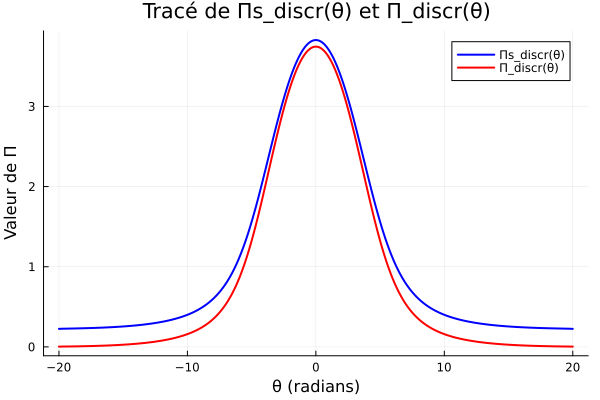

In [53]:
using Plots

# Création du graphique
# Tracé des courbes
p = plot(
    theta_discr, Pi_s_discr,
    label="Πs_discr(θ)",  # Ajout d'une étiquette pour la légende
    linewidth=2,
    color=:blue
)
plot!( p , 
    theta_discr, Pi_discr,
    label="Π_discr(θ)",  # Ajout d'une étiquette pour la légende
    linewidth=2,
    color=:red
)

# Ajout des détails au graphique
xlabel!(p, "θ (radians)")
ylabel!(p, "Valeur de Π")
title!(p, "Tracé de Πs_discr(θ) et Π_discr(θ)")
#grid!(true)  # Active la grille

# Affichage
display(p)


In [54]:
function Delta_thetaMat(theta_discr)
    L = size(theta_discr)[1]

    mat = zeros(L,L)
    

    for i = 1:L
        for j = 1:i
            mat[i,j] = Delta_theta[i]*Delta_theta[j]
            mat[j,i] = mat[i,j]
        end
    end
    mat = Symmetric(mat)
    return mat
end

function Deux_Pi_minus_Pi_s_discr_moyMat(theta_discr)
    L = size(theta_discr)[1]

    mat = zeros(L,L)
    

    for i = 1:L
        for j = 1:i
            mat[i,j] = 1/Pi_minus_Pi_s_discr[i] + 1/Pi_minus_Pi_s_discr[j]
            mat[j,i] = mat[i,j]
        end
    end
    mat = Symmetric(mat)
    return mat
end 
Delta_theta_Mat = Delta_thetaMat(theta_discr)
Deux_Pi_minus_Pi_s_discr_moy_Mat = Deux_Pi_minus_Pi_s_discr_moyMat(theta_discr)

println(size(Deux_Pi_minus_Pi_s_discr_moy_Mat))

(400, 400)


In [55]:
#using Pkg
#Pkg.add("Images")

#using Images
#Pkg.add("Plots")
#Pkg.add("ColorTypes")   # Pour utiliser des couleurs spécifiques

#Spp1 = diagm(0 => (1.0 ./ (Pi_minus_Pi_s_discr .* Pi_over_Pi_s_discr)) .* Delta_theta


    

println(typeof(Delta_Mat))  # Doit être Array{Float64, 2} pour une matrice
println(typeof(Deux_Pi_minus_Pi_s_discr_moy_Mat))  # Devrait être Array ou similaire
println(typeof(Delta_theta))  # Devrait être Vector{Float64}


#Spp2 = Delta_Mat .* Deux_Pi_minus_Pi_s_discr_moy_Mat  .* Delta_theta .* transpose(Delta_theta) ./ (2 .* π)


# Initialiser la matrice M
Spp3 = zeros(L, L)

# Afficher les dimensions des matrices pour déboguer
println("Dimensions de theta_discr: ", size(theta_discr))
println("Dimensions de Delta_theta: ", size(Delta_theta))
println("Dimensions de Delta_Mat: ", size(Delta_Mat))
println("Dimensions de rho_discr: ", size(rho_discr))

# Remplir la matrice M avec la somme
#for c in 1:L  # Pour chaque colonne c de Delta_Mat
#    for b in 1:L  # Pour chaque colonne b de Delta_Mat
        # Calculer le terme correspondant
#        term = -Delta_theta .* Pi_over_Pi_s_discr ./ Pi_minus_Pi_s_discr  # Un vecteur avec la même dimension que Delta_theta
#        term *= Delta_theta[c] * Delta_theta[b]   # Multiplier par les éléments c et b de Delta_theta, ce sont des scalaires
#        Spp3[c, b] = sum(term .* Delta_Mat[:, c] .* Delta_Mat[:, b])/(4*π^2)  # Multiplication élément par élément
#    end
#end
# Calculer les termes nécessaires de manière vectorisée
#term = -Delta_theta ./(nu_discr .* fun_3_discr)  # Un vecteur avec la même dimension que Delta_theta
#Delta_theta_product = Delta_theta' * Delta_theta  # Matrice de taille LxL où chaque élément (c,b) = Delta_theta[c] * Delta_theta[b]
#Delta_Mat_product = Delta_Mat .* Delta_Mat'  # Multiplication élément par élément, produit matriciel des matrices de Delta_Mat
#M .= (term .* Delta_Mat_product) * Delta_theta_product ./ (4 * π^2)




Symmetric{Float64, Matrix{Float64}}
Symmetric{Float64, Matrix{Float64}}
Vector{Float64}
Dimensions de theta_discr: (400,)
Dimensions de Delta_theta: (400,)
Dimensions de Delta_Mat: (400, 400)
Dimensions de rho_discr: (400,)


In [56]:
using Pkg
#Pkg.add("GR")

#Pkg.add("Images")
using Plots
#gr()  # Active le backend GR

#using Images
#Pkg.add("Plots")
#Pkg.add("ColorTypes")   # Pour utiliser des couleurs spécifiques


using Plots

function cherche_indice(ind_cible, liste; plotflag=false)
    L = length(liste)
    liste_ind = Int[]  # Initialise une liste vide pour les indices

    # dans notre cas Pi == 0 que quans il temperature nul quelque par 
    if liste[ind_cible] == 0 
        return [ind_cible]
    end 
    
    # Parcours de la liste
    for i in 1:(L-1)
        if ((liste[i] - liste[ind_cible]) * (liste[i+1] - liste[ind_cible]) <= 0 && liste[ind_cible] != liste[i+1]) ||
   (liste[i] == liste[ind_cible] && liste[ind_cible] == liste[i+1])
            push!(liste_ind, i)
        end
 
    end

    if liste[L] == liste[ind_cible] 
        push!(liste_ind, L)
    end

    # Tracé si plotflag est activé
    if plotflag
        x = 1:L  # Axes des indices
        valeur_cible = liste[ind_cible]

        # Création du graphique
        p = plot(
            x, liste,
            label="Liste",
            linewidth=2,
            legend=:top,
            color=:blue,
            grid=true  # Active la grille
        )
        scatter!(
            p, liste_ind, liste[liste_ind],
            color=:red,
            label="Intersections"
        )
        hline!(
            p, [valeur_cible],
            color=:green,
            linestyle=:dash,
            label="Valeur cible"
        )
        title!(p, "Intersections avec la valeur cible")
        xlabel!(p, "Indice")
        ylabel!(p, "Valeur")

        # Afficher explicitement le graphique
        display(p)
    end

    return liste_ind
end


cherche_indice (generic function with 1 method)

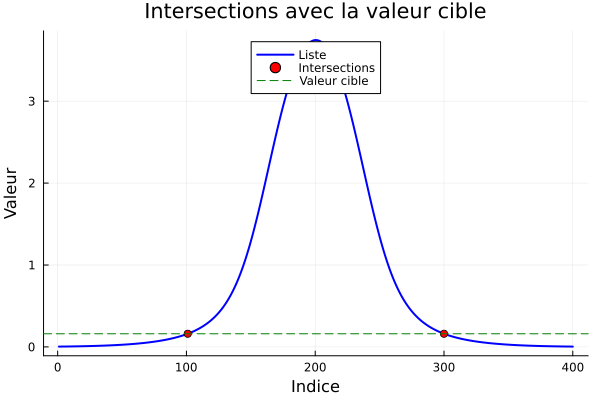

[101, 300]

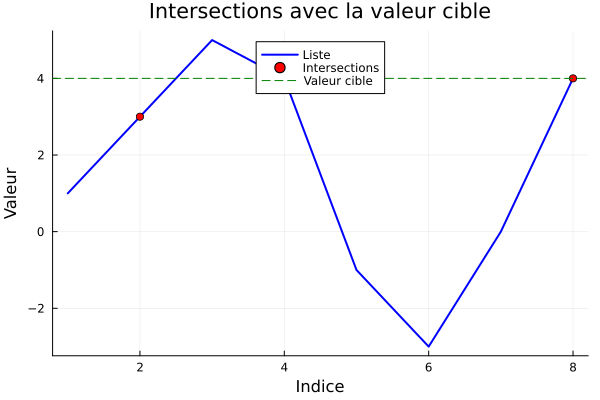

Indices trouvés : [2, 4, 8]


In [57]:
liste_ind = cherche_indice( 300 , Pi_discr  ; plotflag=true) 
print(liste_ind)
liste = [1, 3, 5, 4, -1, -3, 0, 4]
ind_cible = 4  # Valeur cible : liste[4] == 2
resultat = cherche_indice(ind_cible, liste; plotflag=true)

println("Indices trouvés : ", resultat)

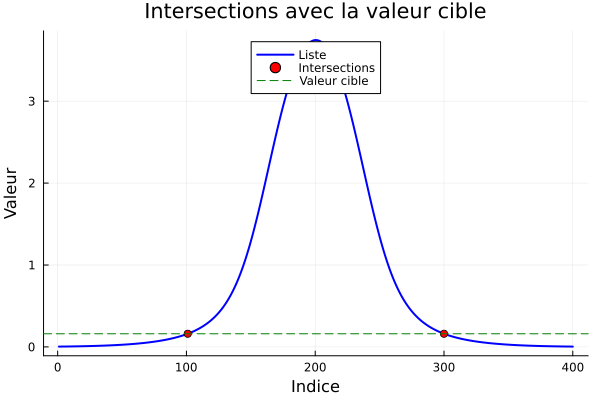

-4.155870530511015


In [58]:

S = 0 
b = 300
liste_ind = cherche_indice( b , Pi_discr  ; plotflag=true) 
for i in liste_ind
    S += 1.0 / (Pi_minus_Pi_s_discr[i] * Pi_over_Pi_s_discr[i]) * Delta_theta[i]  
end
println(S)

In [59]:
L = size(theta_discr)[1]
Spp1 = zeros(L, L)

for b in 1:L
    if Pi_discr[b] > 0
        liste_ind = cherche_indice( b , Pi_discr  ; plotflag=false) 
    else 
        liste_ind = [] 
    end 
    for i in liste_ind
         Spp1[b ,b] += 1.0 / (Pi_minus_Pi_s_discr[i] * Pi_over_Pi_s_discr[i]) * Delta_theta[i]  
    end 
end

#println([Spp1[i,i] for i in 1:L])

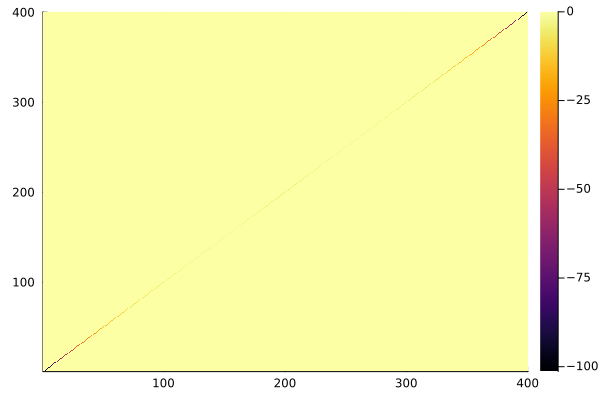

In [60]:
heatmap(Spp1)

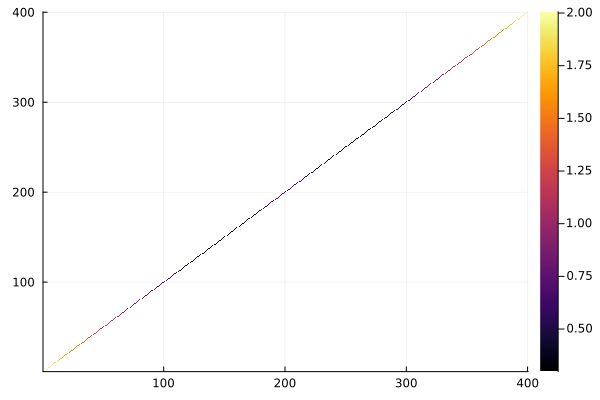

In [61]:
heatmap(log10.(abs.(Spp1)))

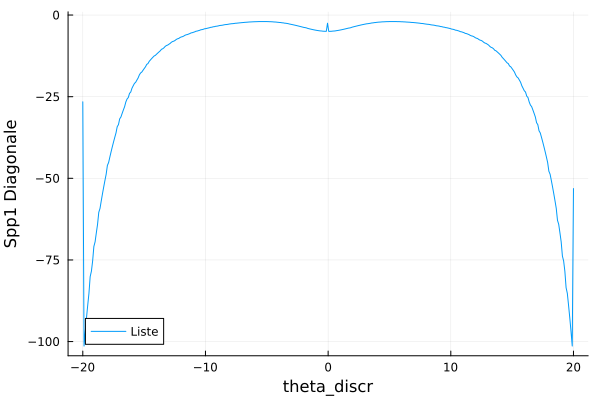

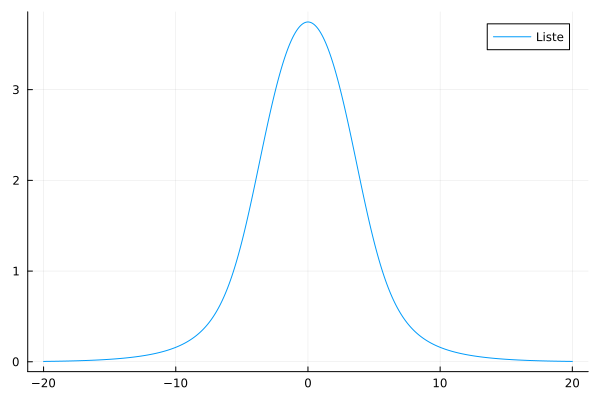

In [62]:
# Création du graphique
p = plot(
    theta_discr, [Spp1[i,i] for i in 1:L],
    label="Liste",
    xlabel="theta_discr",
    ylabel="Spp1 Diagonale"
)

display(p)

p = plot( 
    theta_discr, Pi_discr ,
    label="Liste",
)

display(p)

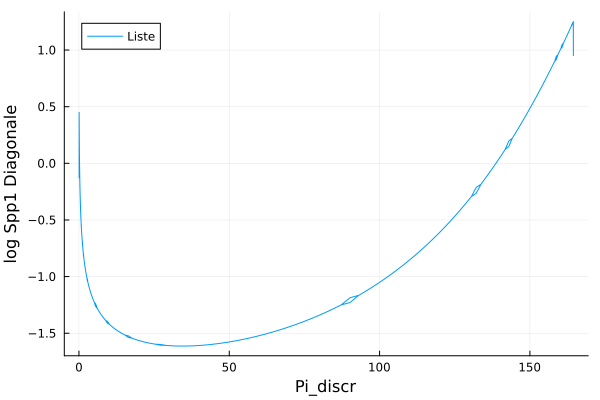

In [20]:
# Création du graphique
p = plot(
    Pi_discr, log10.(abs.([Spp1[i, i] for i in 1:L])),  # Pi_discr contre les éléments diagonaux de Spp1
    label="Liste",
    xlabel="Pi_discr",
    ylabel="log Spp1 Diagonale"
)

# Affichage du graphique
display(p)

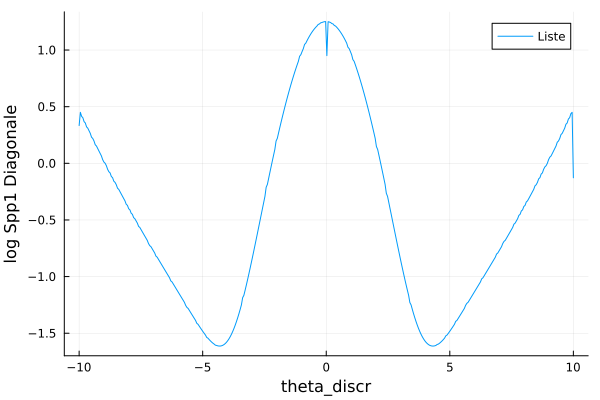

In [21]:
# Création du graphique
p = plot(
    theta_discr, log10.(abs.([Spp1[i, i] for i in 1:L])),  # Pi_discr contre les éléments diagonaux de Spp1
    label="Liste",
    xlabel="theta_discr",
    ylabel="log Spp1 Diagonale"
)

# Affichage du graphique
display(p)

In [22]:
Spp2 = zeros(L, L)
for b in 1:L
    liste_ind_b = cherche_indice( b , Pi_discr )  
    for c in 1:b
        liste_ind_c = cherche_indice( c , Pi_discr  )   
        for i in liste_ind_b
            sum_delta = 0 
            for j in liste_ind_c
                sum_delta += Delta_Mat[i,j]*Delta_theta[i]*Delta_theta[i]
            end 
            Spp2[b ,c] -= 1.0/Pi_minus_Pi_s_discr[i]*sum_delta / (2 .* π)  
        end 
        for i in liste_ind_c
            sum_delta = 0 
            for j in liste_ind_b
                sum_delta += Delta_Mat[i,j]*Delta_theta[i]*Delta_theta[i]
            end 
            Spp2[b ,c] -= 1.0/Pi_minus_Pi_s_discr[i]*sum_delta / (2 .* π)  
        end 
        Spp2[c , b]  = Spp2[b ,c]
    end 
end 
Spp2 = Symmetric(Spp2)




400×400 Symmetric{Float64, Matrix{Float64}}:
 0.0064604    0.00813954   0.00622883  …  0.00813954   0.0029731
 0.00813954   0.0103326    0.00858288     0.0103326    0.00297324
 0.00622883   0.00858288   0.0103037      0.00858288   0.00181163
 0.0056437    0.00766413   0.00988923     0.00766413   0.00181163
 0.00351059   0.00505893   0.00764375     0.00505893   0.0010164
 0.0031771    0.00432141   0.00671169  …  0.00432141   0.0010164
 0.00203089   0.00287821   0.00431021     0.00287821   0.000612205
 0.00186266   0.00250092   0.0037782      0.00250092   0.000612206
 0.00147151   0.00196278   0.00287047     0.00196278   0.000490121
 0.00118571   0.00157211   0.00222587     0.00157211   0.000399654
 0.000862924  0.00117298   0.00156804  …  0.00117298   0.000278432
 0.000810141  0.00106342   0.0014235      0.00106342   0.000278433
 0.000684185  0.000894372  0.00116983     0.000894372  0.000236998
 ⋮                                     ⋱               
 0.000810141  0.00106342   0.0014235 

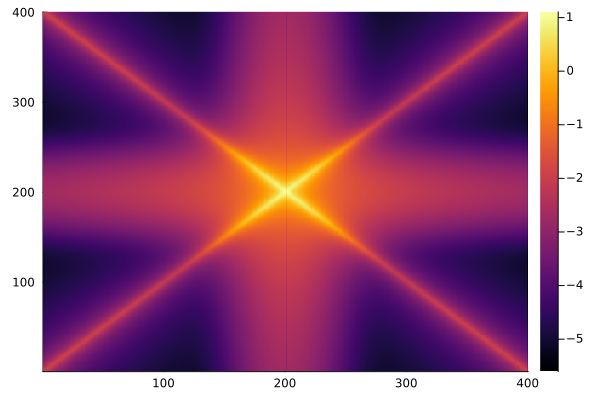

In [23]:
heatmap(log10.(abs.(Spp2)))

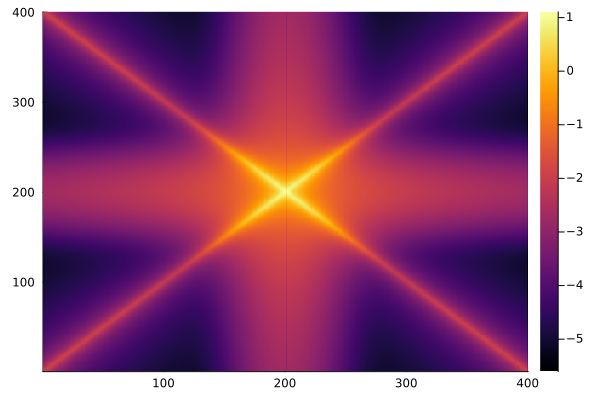

In [24]:
heatmap(log10.((Spp2)))

In [47]:
Spp3 = zeros(L, L)


for b in 1:L
    liste_ind_b = cherche_indice( b , Pi_discr  )  
    if size(liste_ind_b) == 0 
        println(liste_ind_b)
    end
    for c in 1:b
        liste_ind_c = cherche_indice( c , Pi_discr  )  
        for a in 1:L
            Fact = Pi_over_Pi_s_discr[a]/Pi_minus_Pi_s_discr[a]*Delta_theta[a] 
            sum_delta_i = 0 
            for i in liste_ind_c
                sum_delta_i += Delta_Mat[a,i]*Delta_theta[i]
            end 
            sum_delta_j = 0 
            for j in liste_ind_b
                sum_delta_j += Delta_Mat[a,j]*Delta_theta[j]
            end 
            #println(sum_delta_i)
            #println(sum_delta_j)
            Spp3[b ,c] += Fact*sum_delta_i*sum_delta_j/(4* π^2)
            #println(Spp3[b ,c])
        end 
        #println(Spp3[b ,c])
        Spp3[c ,b] = Spp3[b ,c]
    end 
end 

#Spp3 = Symmetric(Spp3)

#println(Spp3)

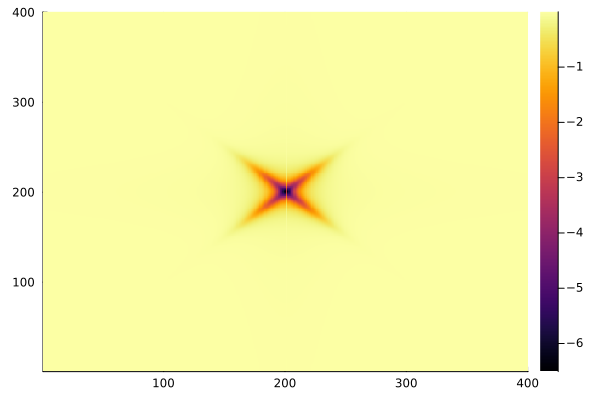

In [48]:
heatmap(Spp3)

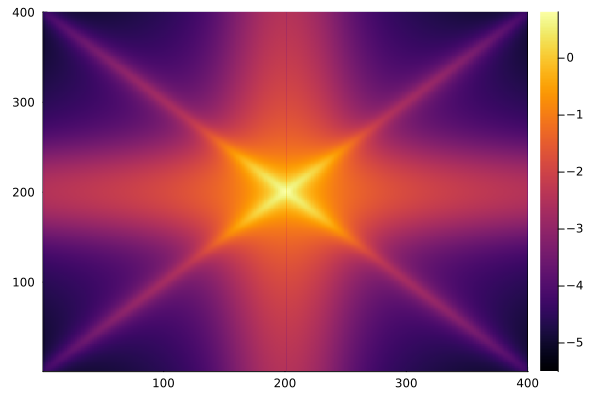

In [49]:
heatmap(log10.(abs.(Spp3)))

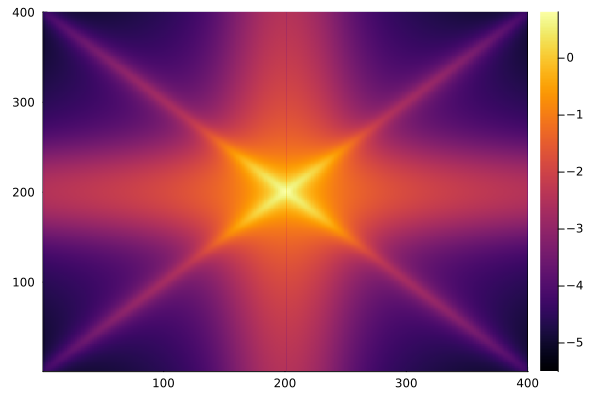

In [50]:
heatmap(log10.(-(Spp3)))

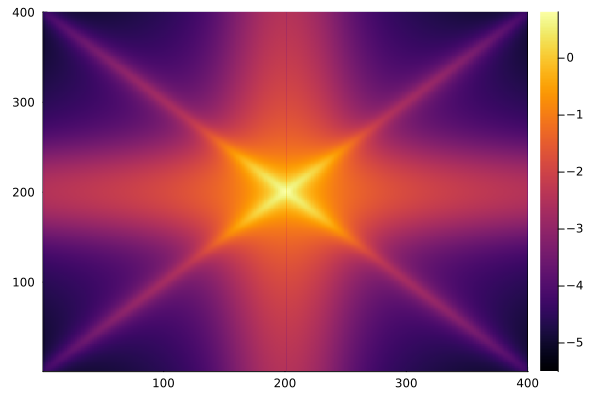

In [28]:
heatmap(log10.(-Spp3))

In [29]:
Spp = Spp1 + Spp2 + Spp3

400×400 Matrix{Float64}:
 -2.14874       0.00810937   0.00619586  …   0.00810937   0.00296429
  0.00810937   -2.80989      0.00853679      0.0102905    0.00296413
  0.00619586    0.00853679  -2.58872         0.00853679   0.00180188
  0.00561067    0.00761759   0.00983419      0.00761759   0.00180187
  0.00347986    0.00501496   0.0075887       0.00501496   0.00100759
  0.00314695    0.00427875   0.00665779  …   0.00427875   0.00100758
  0.00200468    0.00284044   0.00426154      0.00284044   0.000604703
  0.00183711    0.00246482   0.00373148      0.00246482   0.000604697
  0.00144814    0.00192984   0.00282787      0.00192984   0.000483216
  0.00116429    0.00154201   0.0021872       0.00154201   0.000393287
  0.000844299   0.00114643   0.00153466  …   0.00114643   0.000272946
  0.000791913   0.00103795   0.00139151      0.00103795   0.00027294
  0.000667223   0.00087074   0.00114052      0.00087074   0.000231853
  ⋮                                      ⋱               
  0.000791913 

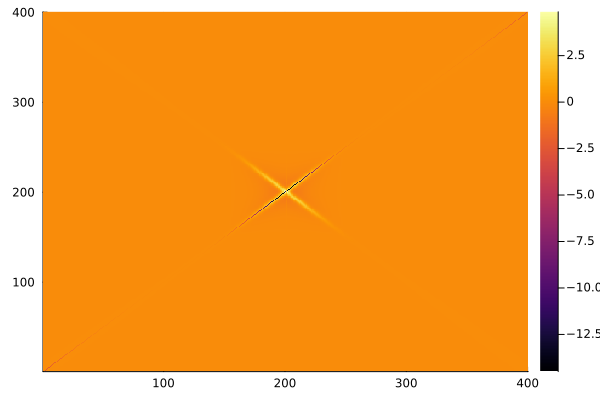

In [35]:
heatmap(Spp)

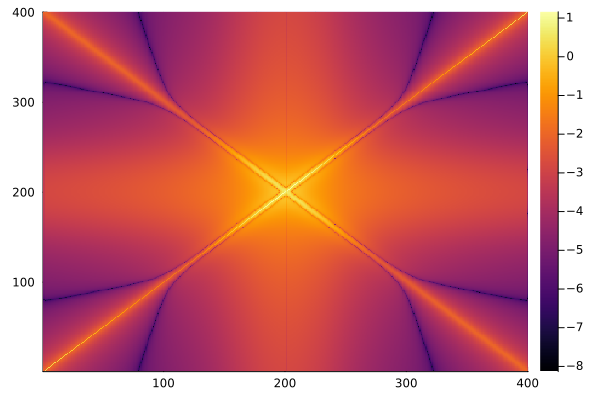

In [30]:
heatmap(log10.(abs.(Spp)))

In [36]:
heatmap(log10.((Spp)))

LoadError: DomainError with -2.1487440546126426:
log10 was called with a negative real argument but will only return a complex result if called with a complex argument. Try log10(Complex(x)).
DomainError detected in the user `f` function. This occurs when the domain of a function is violated.
For example, `log(-1.0)` is undefined because `log` of a real number is defined to only output real
numbers, but `log` of a negative number is complex valued and therefore Julia throws a DomainError
by default. Cases to be aware of include:

* `log(x)`, `sqrt(x)`, `cbrt(x)`, etc. where `x<0`
* `x^y` for `x<0` floating point `y` (example: `(-1.0)^(1/2) == im`)

Within the context of SciML, this error can occur within the solver process even if the domain constraint
would not be violated in the solution due to adaptivity. For example, an ODE solver or optimization
routine may check a step at `new_u` which violates the domain constraint, and if violated reject the
step and use a smaller `dt`. However, the throwing of this error will have halted the solving process.

Thus the recommended fix is to replace this function with the equivalent ones from NaNMath.jl
(https://github.com/JuliaMath/NaNMath.jl) which returns a NaN instead of an error. The solver will then
effectively use the NaN within the error control routines to reject the out of bounds step. Additionally,
one could perform a domain transformation on the variables so that such an issue does not occur in the
definition of `f`.

For more information, check out the following FAQ page:
https://docs.sciml.ai/Optimization/stable/API/FAQ/#The-Solver-Seems-to-Violate-Constraints-During-the-Optimization,-Causing-DomainErrors,-What-Can-I-Do-About-That?


In [37]:
# Vérifier le déterminant  
det_Spp = det(Spp) 
println("Déterminant de Spp: ", det_Spp)
cond_Spp = cond(Spp)
println("Nombre de conditionnement de Spp: ", cond_Spp)


# Si le déterminant est non nul, on peut inverser la matrice
cond_Spp = 4.4922701486291e51
println("cond_Spp: ", cond_Spp)
println("10^60: ", 10.0^60)
println("Is cond_Spp <= 10^60? ", cond_Spp <= 10.0^60)  # Cela devrait retourner true


if  det_Spp != 0 && cond_Spp<= 10.0^60
    A = - inv(Spp)
    
else 
    println("La matrice Spp n'est pas inversible.")
    using LinearAlgebra
    A = -pinv(Spp)
end



Déterminant de Spp: -2.536866332652988e-186
Nombre de conditionnement de Spp: 65126.839916247256
cond_Spp: 4.4922701486291e51
10^60: 1.0e60
Is cond_Spp <= 10^60? true


400×400 Matrix{Float64}:
 0.465424     0.0013743    0.00115322   …  0.0013743    0.00188643
 0.0013743    0.355921     0.0012121       0.00133361   0.00145125
 0.00115322   0.0012121    0.386345        0.0012121    0.00097678
 0.0010782    0.00111735   0.00156024      0.00111735   0.00100394
 0.00074077   0.00081185   0.00132001      0.00081185   0.00062646
 0.00069135   0.00071744   0.00119705   …  0.00071744   0.000641971
 0.000488806  0.000526464  0.000848407     0.000526464  0.000430566
 0.000461865  0.000473289  0.000768614     0.000473289  0.000440328
 0.000389076  0.000396138  0.000624013     0.000396138  0.000375796
 0.000333879  0.000337928  0.000516563     0.000337928  0.000326292
 0.000267331  0.000276219  0.00040074   …  0.000276219  0.000252041
 0.000257974  0.000258457  0.000375199     0.000258457  0.000257113
 0.000231431  0.000230854  0.0003281       0.000230854  0.000232562
 ⋮                                      ⋱               
 0.000257974  0.000258457  0.000375199 

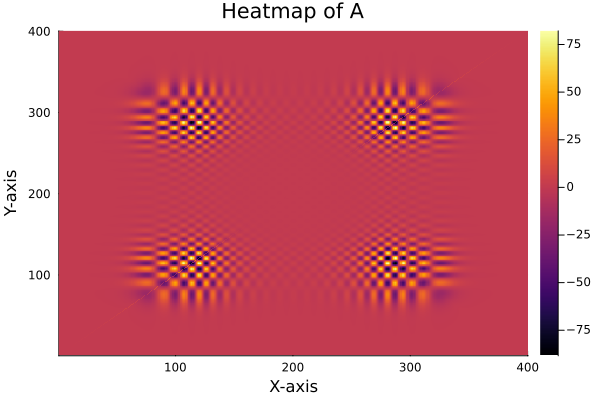

In [43]:
heatmap(A, color=:inferno, title="Heatmap of A", xlabel="X-axis", ylabel="Y-axis")

In [38]:
A_p = [Pi_discr[i] != 0 || Pi_discr[j] != 0 ? A[i, j] : 0 for i in 1:L, j in 1:L]
#println("- Inverse de Spp: ", A_p)
#A_log10 = log10.(abs.(A))
# Afficher la matrice en niveaux de gris
#heatmap(A_log10, color=:inferno, title="Heatmap of log10(A)", xlabel="X-axis", ylabel="Y-axis")
#heatmap(A_p, color=:inferno, title="Heatmap of A", xlabel="X-axis", ylabel="Y-axis")

    
# Tracer la diagonale
#plot(theta_discr, log10.(diag(A)), label="Diagonale de log 10 A", title="Tracé de la diagonale de A", xlabel="theta", ylabel="Valeur", marker=:o)
#plot(theta_discr, diag(A), label="Diagonale de A", title="Tracé de la diagonale de A", xlabel="theta", ylabel="Valeur", marker=:o)


400×400 Matrix{Float64}:
 0.465424     0.0013743    0.00115322   …  0.0013743    0.00188643
 0.0013743    0.355921     0.0012121       0.00133361   0.00145125
 0.00115322   0.0012121    0.386345        0.0012121    0.00097678
 0.0010782    0.00111735   0.00156024      0.00111735   0.00100394
 0.00074077   0.00081185   0.00132001      0.00081185   0.00062646
 0.00069135   0.00071744   0.00119705   …  0.00071744   0.000641971
 0.000488806  0.000526464  0.000848407     0.000526464  0.000430566
 0.000461865  0.000473289  0.000768614     0.000473289  0.000440328
 0.000389076  0.000396138  0.000624013     0.000396138  0.000375796
 0.000333879  0.000337928  0.000516563     0.000337928  0.000326292
 0.000267331  0.000276219  0.00040074   …  0.000276219  0.000252041
 0.000257974  0.000258457  0.000375199     0.000258457  0.000257113
 0.000231431  0.000230854  0.0003281       0.000230854  0.000232562
 ⋮                                      ⋱               
 0.000257974  0.000258457  0.000375199 

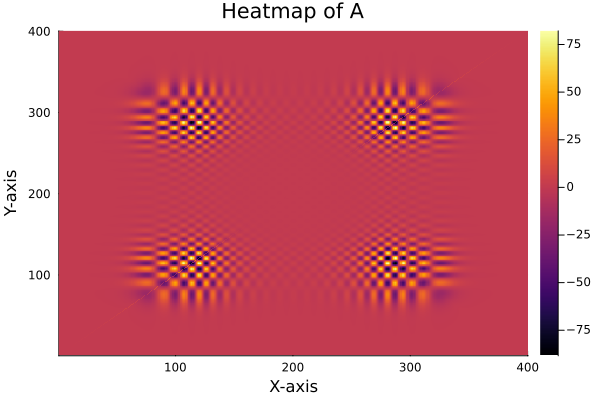

In [39]:
heatmap(A_p, color=:inferno, title="Heatmap of A", xlabel="X-axis", ylabel="Y-axis")

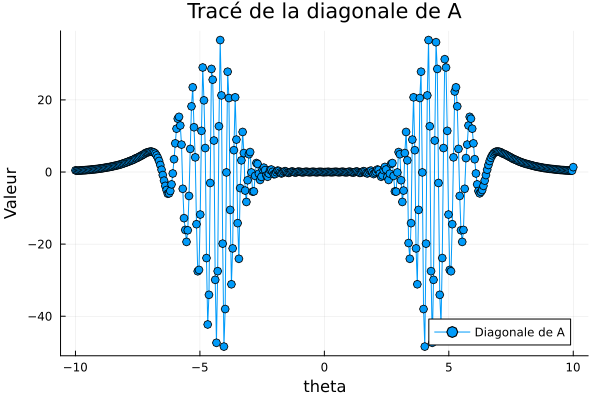

In [40]:
plot(theta_discr, diag(A_p), label="Diagonale de A", title="Tracé de la diagonale de A", xlabel="theta", ylabel="Valeur", marker=:o)

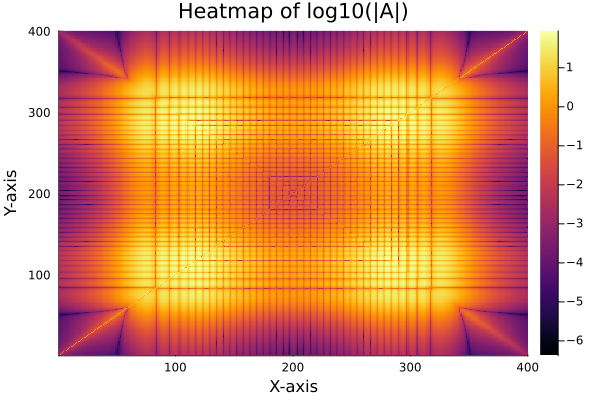

In [41]:
heatmap(log10.(abs.(A_p)), color=:inferno, title="Heatmap of log10(|A|)", xlabel="X-axis", ylabel="Y-axis")

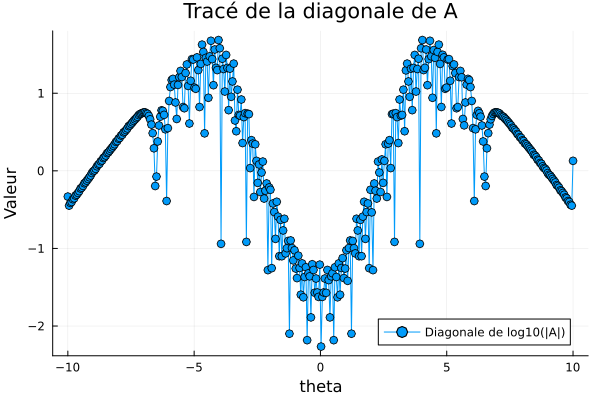

In [42]:
plot(theta_discr, log10.(diag(abs.(A_p))), label="Diagonale de log10(|A|)", title="Tracé de la diagonale de A", xlabel="theta", ylabel="Valeur", marker=:o)


In [344]:
using LinearAlgebra


# Calcul des différentes normes
frobenius_norm = norm(Spp1)
L1_norm = norm(Spp1, 1)
L2_norm = norm(Spp1, 2)
inf_norm = norm(Spp1, Inf)

# Affichage des résultats
println("Norme Frobenius : ", norm(Spp1) , " , " ,  norm(Spp2) , " , " ,  norm(Spp3))
println("Norme L1 : ",  norm(Spp1 , 1) , " , " ,  norm(Spp2, 1 ) , " , " ,  norm(Spp3, 1))
println("Norme L2 : ",  norm(Spp1 , 2) , " , " ,  norm(Spp2, 2 ) , " , " ,  norm(Spp3, 2))
println("Norme de l'infini : ",  norm(Spp1 , Inf) , " , " ,  norm(Spp2, Inf ) , " , " ,  norm(Spp3, Inf))

# Calcul de la norme d'une colonne et d'une ligne
column_norm = norm(A[:, 1])
row_norm = norm(A[1, :])

println("Norme de la première colonne : ", column_norm)
println("Norme de la première ligne : ", row_norm)


Norme Frobenius : 99.60156048628534 , 133.19086529896128 , 100.09023088391534
Norme L1 : 911.7818531894122 , 6259.82762459583 , 6161.4835854333105
Norme L2 : 99.60156048628534 , 133.19086529896128 , 100.09023088391534
Norme de l'infini : 17.84846328093542 , 12.829650258308249 , 6.507913021226475
Norme de la première colonne : 0.4677875126238414
Norme de la première ligne : 0.4677875126238414


# Démonstration de la formule

$$
(A + H)^{-1} = \sum_{k=0}^\infty (-1)^k (A^{-1} H)^k A^{-1}
$$

## Hypothèse de départ

Soit \( A \) une matrice inversible et \( H \) une perturbation telle que \( \| A^{-1} H \| < 1 \).  
Cette condition garantit la convergence de la série géométrique matricielle. Nous cherchons à exprimer l’inverse de \( A + H \) en termes de \( A^{-1} \) et \( H \).

---

## Étapes de la démonstration

### Étape 1 : Formulation du problème

On commence avec l'identité matricielle fondamentale :

\[
(A + H)(A + H)^{-1} = I,
\]

où \( I \) est la matrice identité. Multiplions par \( A^{-1} \) à gauche :

\[
A^{-1}(A + H)(A + H)^{-1} = A^{-1}.
\]

En développant le produit matriciel :

\[
(I + A^{-1} H)(A + H)^{-1} = A^{-1}.
\]

Posons \( B = (A + H)^{-1} \). Cela donne :

\[
(I + A^{-1} H)B = A^{-1}.
\]

---

### Étape 2 : Résolution de l’équation

Réorganisons pour isoler \( B \) :

\[
B = (I + A^{-1} H)^{-1} A^{-1}.
\]

Développons \( (I + A^{-1} H)^{-1} \). Si \( \| A^{-1} H \| < 1 \), nous pouvons appliquer la formule de la série géométrique matricielle :

\[
(I + A^{-1} H)^{-1} = \sum_{k=0}^\infty (-1)^k (A^{-1} H)^k.
\]

Substituons cette expression dans \( B \) :

\[
B = \left( \sum_{k=0}^\infty (-1)^k (A^{-1} H)^k \right) A^{-1}.
\]

En réorganisant :

\[
(A + H)^{-1} = \sum_{k=0}^\infty (-1)^k (A^{-1} H)^k A^{-1}.
\]

---

## Conditions de validité

La série converge si \( \| A^{-1} H \| < 1 \), c’est-à-dire que \( H \) est suffisamment "petite" par rapport à \( A \).  
Cette condition garantit que \( (I + A^{-1} H)^{-1} \) est bien définie et que la série géométrique converge.

---

## Applications

1. **Physique** : Approximations d’opérateurs inverses dans des systèmes perturbés.
2. **Mathématiques numériques** : Calcul rapide des inverses de matrices légèrement perturbées.


In [345]:
using LinearAlgebra

A = Spp1
H = Spp2 + Spp3

# Affichage des résultats
println("Norme Frobenius : ", norm(A) , " , " ,  norm(H) )
println("Norme L1 : ",  norm(A , 1) , " , " ,  norm(H, 1 ) )
println("Norme L2 : ",  norm(A , 2) , " , " ,  norm(H, 2 ) )
println("Norme de l'infini : ",  norm(A , Inf) , " , " ,  norm(H, Inf ) )

# Calcul de la norme d'une colonne et d'une ligne
column_norm = norm(A[:, 1])
row_norm = norm(A[1, :])

println("Norme de la première colonne : ", column_norm)
println("Norme de la première ligne : ", row_norm)


Norme Frobenius : 99.60156048628534 , 48.51389907562676
Norme L1 : 911.7818531894122 , 2482.894328217478
Norme L2 : 99.60156048628534 , 48.51389907562676
Norme de l'infini : 17.84846328093542 , 6.3217372370817735
Norme de la première colonne : 2.155179705399932
Norme de la première ligne : 2.155179705399932


In [346]:
det_A = det(A) 
println("Déterminant de A: ", det_A)
cond_A = cond(A)
println("Nombre de conditionnement de A: ", cond_A)
heatmap(Spp)

# Si le déterminant est non nul, on peut inverser la matrice
if 1==1 && det_A != 0 && cond_A<= 10^11
    invA = inv(A)
elseif 1==1 
    println("La matrice Spp n'est pas inversible.")
    invA = pinv(H)
end

# Affichage des résultats
println("Norme Frobenius : ", norm(invA*H)  )
println("Norme L1 : ",  norm(invA*H , 1) )
println("Norme L2 : ",  norm(invA*H , 2)  )
println("Norme de l'infini : ",  norm(invA*H , Inf)  )

Déterminant de A: 1.5138964512805551e-167
Nombre de conditionnement de A: 732.4871894626929
Norme Frobenius : 18.84887346273991
Norme L1 : 2710.7334803264794
Norme L2 : 18.84887346273991
Norme de l'infini : 0.35418944127443436


In [347]:
det_H = det(H) 
println("Déterminant de H: ", det_H)
cond_H = cond(H)
println("Nombre de conditionnement de H: ", cond_H)


# Si le déterminant est non nul, on peut inverser la matrice
if 1==1 && det_H != 0 && cond_H<= 10^26
    invH = inv(H)
elseif 1==1 
    println("La matrice Spp n'est pas inversible.")
    invH = pinv(H)
end

# Affichage des résultats
println("Norme Frobenius : ", norm(A*invH)  )
println("Norme L1 : ",  norm(A*invH , 1) )
println("Norme L2 : ",  norm(A*invH , 2)  )
println("Norme de l'infini : ",  norm(A*invH , Inf)  )

Déterminant de H: 0.0
Nombre de conditionnement de H: 5.425497526769418e20
La matrice Spp n'est pas inversible.
Norme Frobenius : 4.267756007506362e6
Norme L1 : 1.1762908170102066e8
Norme L2 : 4.267756007506362e6
Norme de l'infini : 671678.028003435


In [348]:
using LinearAlgebra

# Fonction pour calculer (A + H)^-1 en utilisant la série de Taylor
function compute_inverse_taylor(A, H; tol=1e-10, max_iter=100)
    # Vérification si A est inversible
    if det(A) == 0
        error("La matrice A n'est pas inversible!")
    end
    
    # Calcul de A^-1
    A_inv = inv(A)
    
    # Vérification de la condition ∥A⁻¹H∥ < 1
    norm_A_inv_H = norm(A_inv * H)
    if norm_A_inv_H >= 1
        error("La norme de A⁻¹H n'est pas inférieure à 1, la série de Taylor ne converge pas.")
    end
    
    # Initialisation de la somme de la série
    sum_series = Matrix{Float64}(I, size(A, 1), size(A, 2))  # Commence avec l'identité
    current_term = Matrix{Float64}(I, size(A, 1), size(A, 2))  # Terme de la série (A⁻¹H)^0
    
    # Calcul des termes de la série jusqu'à ce que la norme de la différence soit inférieure à tolérance
    for k in 1:max_iter
        # Mise à jour du terme de la série
        current_term = current_term * (A_inv * H)
        
        # Ajouter le terme actuel à la somme, avec (-1)^k
        sum_series += ((-1)^k) * current_term
        
        # Vérifier si le terme actuel est suffisamment petit
        if norm(current_term) < tol
            println("Convergence atteinte après $k termes.")
            break
        end
    end
    
    return sum_series * A_inv  # Retourne (A + H)^-1 = Σ (-1)^k (A⁻¹ H)^k A⁻¹
end


compute_inverse_taylor (generic function with 1 method)

In [349]:
# Définir des matrices A et H
#A = [4.0 1.0; 1.0 3.0]
#H = [1.0 0.5; 0.5 1.5]

# Calculer (A + H)^-1 en utilisant la série de Taylor
result = compute_inverse_taylor( A , H , max_iter= 1)
println("Le résultat de (A + H)^-1 est :")
#println(result)
println(norm(result - inv(A+H)))

LoadError: La norme de A⁻¹H n'est pas inférieure à 1, la série de Taylor ne converge pas.

In [350]:
# Calcul des valeurs propres
λ = eigen(A).values

# Vérification si 0 est dans λ
if any(λ .== 0)
    println("Il y a un zéro parmi les valeurs propres.")
else
    println("Aucune valeur propre n'est égale à zéro.")
end

# Produit des valeurs propres
prod_λ = prod(λ)

# Déterminant de la matrice
det_A = det(A)

#println("Valeurs propres de A : ", λ)
println("Produit des valeurs propres : ", prod_λ)
println("Déterminant de A : ", det_A)

# Arrondir les valeurs
λ_rounded = round.(λ, digits=100)  # Arrondir à 0 décimale
prod_λ_rounded = prod(λ_rounded)  # Arrondir le produit à 0 décimale
det_A_rounded = round(det_A, digits=10)  # Arrondir le déterminant à 0 décimale

#println("Valeurs propres de A (arrondies) : ", λ_rounded)
println("Produit des valeurs propres (arrondi) : ", prod_λ_rounded)
println("Déterminant de A (arrondi) : ", det_A_rounded)

Aucune valeur propre n'est égale à zéro.
Produit des valeurs propres : 1.5138964512805551e-167
Déterminant de A : 1.5138964512805551e-167
Produit des valeurs propres (arrondi) : 1.5138964512805506e-167
Déterminant de A (arrondi) : 0.0


In [ ]:
heatmap(log10.(abs.(Spp-M)))

In [ ]:
heatmap(log10.(abs.(M)))

In [ ]:
heatmap(log10.(abs.((Spp-M)./M)))

In [ ]:
heatmap(log10.(abs.(M)))

In [ ]:
A = [1 2 3; 4 5 6]   # Matrice 2x3
B = [2 2 2; 2 2 2]   # Matrice 2x3
result = A ./ B      # [[0.5 1.0 1.5]; [2.0 2.5 3.0]]

In [ ]:
A = [1, 2, 3, 4]  # Vecteur 1
B = [2, 2, 2, 2]  # Vecteur 2
result = A ./ B    # [0.5, 1.0, 1.5, 2.0]

In [ ]:
result = A' * B    # [0.5, 1.0, 1.5, 2.0]

In [ ]:
T = 600#coef(fit)[1]  
n_p = 56.46504685
mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
println("mu = ", mu)
mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1] 
#mu = 29.993145799296883
println("mu = ", mu)
println("T = ", T) 
println("n_p , model_mu(T , mu)", model_mu(T*ones(1) , mu*ones(1))[1])
mup = mu*kB
Taille = 24.780000000000086  #mu m 
n_p = "None"
println("npts = ", npts)
@time theta_discr = LinRange(-theta_max, theta_max, npts)


theta_discr , nu_discr , rho_s_discr , rho_discr ,veff_bord, veff_bord_coup ,
theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = 
save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )

@time beta = [-mup / (kB * T) 0 mass /(kB * T)]
@time nu_discr = yangyang(gbar, beta, theta_discr)

p = plot(xlabel="\$\\tilde{\\theta}\$", ylabel="nu", legend=:topright)
plot!(p, theta_discr, nu_discr, label="nu")
display(p)


In [ ]:
using DelimitedFiles

date_donnees = "2024-04-24"

DONNEES = []

if date_donnees == "None"
    fichier_x = "Scan43_coupure2_1ms_x.txt"
    fichier_y = "Scan43_coupure2_1ms_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "2em coupure 1ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_coupure1_10ms_x.txt"
    fichier_y = "Scan43_coupure1_10ms_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "1er coupure 10 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_x.txt"
    fichier_y = "Scan43_n.txt"
    Donnees = [readdlm("2024-02-05/Donnees/$(fichier_x)") , reverse(readdlm("2024-02-05/Donnees/$(fichier_y)")) * 0 , "2em coupure 40 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-05"
    fichier_x = "Scan43_coupure2_1ms_x.txt"
    fichier_y = "Scan43_coupure2_1ms_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "2em coupure 1ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_coupure1_10ms_x.txt"
    fichier_y = "Scan43_coupure1_10ms_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "1er coupure 10 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "Scan43_x.txt"
    fichier_y = "Scan43_n.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , reverse(readdlm("$(date_donnees)/Donnees/$(fichier_y)")) , "2em coupure 40 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-09"
    fichier_x = "X_Scan704_18ms.txt"
    fichier_y = "Y_Scan704_18ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "Première coupure expansion 18 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_Scan696_1ms.txt"
    fichier_y = "Y_Scan696_1ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "Seconde coupure sélection 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_Scan696_50ms.txt"
    fichier_y = "Y_Scan696_50ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "Seconde coupure expansion 50 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-02-29" 
    fichier_x = "X_coupure1_1ms.txt"
    fichier_y = "Y_coupure1_1ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure1_28ms.txt"
    fichier_y = "Y_coupure1_28ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 28 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_1ms.txt"
    fichier_y = "Y_coupure2_1ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_50ms.txt"
    fichier_y = "Y_coupure2_50ms.txt"
    Donnees = [-readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 50 ms"]
    push!(DONNEES, Donnees)
elseif date_donnees == "2024-04-24"
    fichier_x = "X_coupure1_1ms.txt"
    fichier_y = "Y_coupure1_1ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure1_18ms.txt"
    fichier_y = "Y_coupure1_18ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 1 18 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_1ms.txt"
    fichier_y = "Y_coupure2_1ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 1 ms"]
    push!(DONNEES, Donnees)
    fichier_x = "X_coupure2_30ms.txt"
    fichier_y = "Y_coupure2_30ms.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "coupure 2 30 ms"]
    push!(DONNEES, Donnees)    
    fichier_x = "X_insitut.txt"
    fichier_y = "Y_insitut.txt"
    Donnees = [readdlm("$(date_donnees)/Donnees/$(fichier_x)") , readdlm("$(date_donnees)/Donnees/$(fichier_y)") , "insitut"]
    push!(DONNEES, Donnees)                         
end

for i in 1:length(DONNEES)
    p = plot(xlabel="x", ylabel="y", legend=:topright)                           
    x , y , label = DONNEES[i]    
    plot!(p, x/18,  y, label = label)
    display(p)                         
end                             

# Bord ( 2em coupure homogène)

In [ ]:
function pre_model_fit_homo(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    
    function box_expansion(n_fun, dt, list_t_save, theta_max, npts, gb, ratio_m_hbar)
        
        filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
    
        tmax = maximum(list_t_save)
        theta_tab = LinRange(-theta_max, theta_max, npts)
        x1 = -0.5 * ones(npts) + 0.0000001*theta_tab
        x2 = 0.5 * ones(npts) + 0.0000001*theta_tab

        t = 0

        mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
        println(@sprintf "t = %.3f saved" t*Taille)
        filename = filename0 * @sprintf("%.3f.npz", Float64(t))
        println("saved : ", filename)
        npzwrite(filename, mydensity)

        #p = plot(xlabel="x", ylabel="n", legend=:topright)
        #plot!(p, mydensity[1,:],  mydensity[2,:] )
        #display(p)
        while t<tmax
            x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
            t += dt

            for ts in list_t_save
                if ts <= t < (ts + dt)
                    mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                    println(@sprintf "t = %.3f saved" t*Taille)
                    filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                    println("saved : ", filename)
                    npzwrite(filename, mydensity)

                    #p = plot(xlabel="x", ylabel="n", legend=:topright)
                    #plot!(p, mydensity[1,:],  mydensity[2,:] )
                    #display(p)
                end
            end
        end  
        
        p = plot(xlabel="x", ylabel="n", legend=:topright)
        plot!(p, mydensity[1,:],  mydensity[2,:] )
        display(p)
        return mydensity[1,:],  mydensity[2,:]
    end
    
    theta_discr , nu_discr , rho_s_discr , rho_discr , veff_bord , veff_bord_coup ,theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    # Créer l'interpolation
    #@time nu_fun = LinearInterpolation(theta_discr, nu_discr)
    @time nu_fun = LinearInterpolation(theta_discr, nu_theta_star_discr)

    # Afficher l'interpolation
    #p = plot(xlabel="theta", ylabel="nu", legend=:topright)
    #plot!(p, theta_discr,  nu_discr )
    #plot!(p, theta_discr, nu_fun(theta_discr))
    #display(p)
    
    temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille ]
    temps_sav = [ 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille, 50.0/Taille ]
    dt = 0.9/Taille
    temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
    temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]

    #temps_sav = [ 50.0/Taille  ]
    dt = 1/Taille
    return box_expansion(nu_fun, dt ,temps_sav  , theta_max , npts , gbar, mass/hbar)
end

nom = "theta_star_1.0_h"
theta_discr = LinRange(-theta_max, theta_max , npts) 

function model_fit_homo(x , p )
    mup , T = p[1]*kB , p[2]
    n_p = "None"
    println("mup = ", mup/kB)
    println("T = ", T)  
    
    x_simul , y_simul = pre_model_fit_homo(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )
    density_fun = LinearInterpolation(x_simul , y_simul) 
    p = plot(xlabel="xxx", ylabel="n", legend=:topright)
    plot!(p, x,  last(DONNEES)[2])
    plot!(p, x,  density_fun.(x))
    display(p)
    return Float64.(density_fun.(x))
end 

# Bord (2em coupure ihomogène)

## evolution d'un bord 

In [ ]:
#-------------------------------------------------------------------------------------
#	time evolution for box expansion
#-------------------------------------------------------------------------------------

function evol_edge_expansion(dt, x, gb, theta_tab, n_fun)
    npts_integral = 600
    L = size(x)[1]
    
    veff_tab = zeros(L)

    f = linear_interpolation(x, theta_tab)

    #velocity of first and last points is the one of free particles
    veff_tab[1] = theta_tab[1]

    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,npts_integral)
        n_discr = n_fun.(lam_discr)
        #println("vell")
        #@time veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        #velocities of right contour (using parity symmetry)
    end
    
    return x + dt*veff_tab
end

function evol_edge_expansion_balistic(dt, x, gb, theta_tab, n_fun)
    npts_integral = 600
    L = size(x)[1]
    
    veff_tab = zeros(L)

    f = linear_interpolation(x, theta_tab)

    #velocity of first and last points is the one of free particles
    veff_tab[1] = theta_tab[1]

    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,npts_integral)
        n_discr = n_fun.(lam_discr)
        veff_tab[j] = last(veff(gb, lam_discr, n_discr))
        #velocities of right contour (using parity symmetry)
    end
    
    return x + dt*veff_tab
end

#-------------------------------------------------------------------------------------
#	box expansion: calculate density (careful: return density in units of rapidities
#    for density in mu^-1 multiply by mass/hbar)
#-------------------------------------------------------------------------------------

function eval_edge_density(x, gb, theta_tab, nu_fun, ratio_m_hbar)
    npts_integral = 600
    
    L = size(x)[1]
    dens = zeros(2,L)
    dens[1,1] = x[1]
    dens[2,1] = 0
    thet1 = theta_tab[1]


    for j in 2:L
        thet1 = theta_tab[j]
        thet2 = theta_tab[1]
        lam_discr = LinRange(thet2,thet1,npts_integral)
        nu_discr = nu_fun.(lam_discr)
        dens[1,j] = x[j]      
        dens[2,j] = ratio_m_hbar * charge_density(gb, lam_discr, nu_discr, ones(size(lam_discr)[1]) )
    end
    
    println( "la densité haute est : " , dens[2,L])

    #sort densities according to positions, and return
    return dens[:,sortperm(dens[1, :])] #, nu
end



In [ ]:
function pre_model_fit_inhomo(new_date , nom,  theta_discr, n_p , mup ,  T , Taille , gbar , mode , x , y  )
    
    calcule_deformation, fit_deformation, calcule_expension, fit_expension = mode
    
    nom = "theta_edge_1.0_ih1"
    
    if calcule_deformation
        
        if fit_deformation && n_p != "None"
            mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
            println( "mup : " , mup , "    " ,  mup/kB )
        end
        
        
        theta_discr , nu_discr , rho_s_discr , rho_discr ,veff_bord, veff_bord_coup ,
        theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = 
        save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )

        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
        filename1 = @sprintf "%s/nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)

        function edge_expansion(n_fun, theta_max, npts, gb, ratio_m_hbar)
            theta_tab = LinRange(-theta_max, theta_max, npts)
            x = 0.0000001*theta_tab
            
            
            t = 0
            mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %.3f saved" t*Taille)
            filename = filename0 * @sprintf("%.3f.npz", Float64(t))
            println("saved : ", filename)
            npzwrite(filename, mydensity)
            filename = @sprintf "%s/bord_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
            println("saved : ", filename)
            npzwrite(filename, x)

            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)
            
            t = "veff_bord"
            x = veff_bord_coup
            mydensity = eval_edge_density(x , gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %s saved" t)
            filename = filename0 * @sprintf("%s.npz", t)
            println("saved : ", filename)
            npzwrite(filename, mydensity)
 
            p = plot(xlabel="v", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)
        end

        # Créer l'interpolation
        nu_fun = LinearInterpolation(theta_discr, nu_discr)

        # Afficher l'interpolation
        p = plot(xlabel="theta", ylabel="nu", legend=:topright)
        plot!(p, theta_discr,  nu_discr )
        plot!(p, theta_discr, nu_fun(theta_discr))
        display(p)

        edge_expansion(nu_fun, theta_max , npts , gbar, mass/hbar)

        ###Coupure de taile $\ell$ + evolution
        t = "veff_bord"
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
        filename = filename0 * @sprintf("%s.npz", t)
        #filename = @sprintf "%s/density_expansion_nu_edge_julia_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        density = npzread(filename)

        t_deforme = 18

        x1 = density[1,:]*t_deforme/Taille
        
        p = plot(ylabel="n", xlabel="x", legend=:topright)
        plot!(p,  x1 , density[2,:])
        display(p)
        
        if fit_deformation 
            return veff_bord , density[2,:] 
        end
    end 
    
    if calcule_expension 
    
        ###Coupure de taile $\ell$ + evolution
        #t = 1/Taille
        #filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)
        #filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
        #filename = @sprintf "%s/density_expansion_nu_edge_julia_%.3f_%.3f_%.3f_%.3f.npz" new_date Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        #density = npzread(filename)

        #t_deforme = 28/Taille
        # on coupe où (x/\ell)^2 > 1/4 
        #x1 = density[1,:]*t_deforme/t    

        #println( size(x1))
        #y1 = density[2,:]
        #g , d  = 110 - 10 , 110+10
        #p = plot(ylabel="x", xlabel="n", legend=:topright)
        #plot!(p,  x1[g:d] , y1[g:d])
        #display(p)
        #x_fun = LinearInterpolation(theta_discr,x1)
        #theta_fun = LinearInterpolation(x1, theta_discr)
        #x_squared = x1 .^ 2
        #x_squared_fun = LinearInterpolation(theta_discr, x_squared)

        #f = LinearInterpolation(theta_discr, x_squared)
        #f = theta -> linear_interpolation(theta_discr, x_squared.-1/4)(theta)
        #p = plot(ylabel="theta", xlabel="x^2 - 1/4", legend=:topright)
        #plot!(p,  theta_discr , f(theta_discr))
        #display(p)
        #theta_1 = fzero(f, theta_discr[1] , theta_fun(0))
        #theta_2 = fzero(f, theta_fun(0) , last(theta_discr))

        #x2 = ifelse.(x_squared .> 1/4, 0, x1)

        #p = plot(ylabel="theta", xlabel="x", legend=:topright)
        #plot!(p,  x1 , theta_discr)
        #plot!(p,  x2 , theta_discr)
        #vline!(p, [x_fun(theta_1), x_fun(theta_2)], linestyle=:dash, color=:red, linewidth=2)
        #hline!(p, [theta_1, theta_2], linestyle=:dash, color=:red, linewidth=2)
        #display(p)

        #npts = 200
        #theta_discr_2 = LinRange(theta_1, theta_2 , npts)
        #max_abs_theta = maximum(abs.(theta_discr_2))
        #max_abs_theta = maximum([20 , max_abs_theta])
        #theta_discr_gauche = LinRange(-max_abs_theta, theta_1 , npts)
        #theta_discr_2 = cat(theta_discr_gauche, theta_discr_2, dims=1)

        nom = "theta_edge_1.0_ih2"
        index_last_underscore = findlast(isequal('_'), nom)
        println(nom[index_last_underscore+1:end])

        ## bord gauche 
        #x_2 = cat(x_fun(theta_1) * ones(size(theta_discr_gauche)[1]) , LinRange(x_fun(theta_1), x_fun(theta_2) , npts) , dims = 1 )
        #x_2_fun = LinearInterpolation(theta_discr_2, x_2)
        #theta_discr_2 = LinRange(theta_discr_2[1], last(theta_discr_2) , npts)
        #x_2 = x_2_fun(theta_discr_2)
        #filename = @sprintf "%s/theta_discr_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom[index_last_underscore+1:end] Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        #npzwrite(filename, theta_discr_2 )
        #println("saved : ", filename)
        #filename = @sprintf "%s/x_%s_%.3f_%.3f_%.3f_%.3f.npz.npz" new_date nom[index_last_underscore+1:end] Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
        #npzwrite(filename, x_2 )
        #println("saved : ", filename)



        #p = plot(ylabel="theta", xlabel="x", legend=:topright)
        #plot!(p,  x1 , theta_discr)
        #plot!(p,  x_2 , theta_discr_2)
        #vline!(p, [x_fun(theta_1), x_fun(theta_2)], linestyle=:dash, color=:red, linewidth=2)
        #hline!(p, [theta_1, theta_2], linestyle=:dash, color=:red, linewidth=2)
        #display(p)

        #p = plot(ylabel="theta", xlabel="x", legend=:topright)
        #plot!(p,  x_2 , theta_discr_2)
        #vline!(p, [0 , x_fun(theta_star)], linestyle=:dash, color=:red, linewidth=2)
        #hline!(p, [theta_fun(0) , theta_star], linestyle=:dash, color=:red, linewidth=2)
        #display(p)
        
        x_fun = LinearInterpolation(theta_discr,x1)
        theta_fun = LinearInterpolation(x1, theta_discr)
        x_1 , x_2 = 0.35703724778046375 , 1.3570372477804638
        
        theta_1 , theta_2 = theta_fun(x_1), theta_fun(x_2)
        max_abs_theta = maximum([20 , abs(theta_1) , abs(theta_2)])
        
        theta_bord1 = LinRange(-max_abs_theta, theta_1 , 100)
        x1_bord1 = x_1*ones(size(theta_bord1)[1])
        
        
        theta_bord2 = LinRange(theta_1+0.0000001, theta_2 , 100)
        L = size(theta_bord2)[1]
        x1_bord2 = zeros(L)
        for i = 1 : L 
            x1_bord2[i] = x_fun(theta_bord2[i])
        end 
        
        theta_discr = cat(theta_bord1 ,theta_bord2 , dims = 1 )
        x1 = cat(x1_bord1 ,x1_bord2 , dims = 1 )
        
        x2 = x_2*ones(size(theta_discr)[1])
        
        p = plot(ylabel="theta", xlabel="x", legend=:topright)
        plot!(p,  x1 , theta_discr , label = "x1")
        plot!(p,  x2 , theta_discr , label = "x2")
        plot!(p,  x1_bord1 , theta_bord1 , label = "x1_bord1")
        plot!(p,  x1_bord2 , theta_bord2 , label = "x1_bord2")
        
        #vline!(p, [0 , x_fun(theta_star)], linestyle=:dash, color=:red, linewidth=2)
        #hline!(p, [theta_fun(0) , theta_star], linestyle=:dash, color=:red, linewidth=2)
        display(p)
        

        #save_nu_rho_rho_s(new_date , nom , theta_discr_2, n_p , mup , T , Taille , gbar )
        theta_discr , nu_discr , rho_s_discr , rho_discr ,veff_bord, veff_bord_coup ,  theta_star, nu_theta_star_discr, rho_s_theta_star_discr, rho_theta_star_discr = save_nu_rho_rho_s(new_date , nom , theta_discr, n_p , mup ,  T , Taille , gbar )


        #println( mup )
        filename0 = @sprintf "%s/density_expansion_nu_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_theta_edge_2_julia_%.3f_%.3f_%.3f_" new_date Float64(mup/kB) Float64(T) Float64(Taille)
        filename0 = @sprintf "%s/density_expansion_nu_%s_%.3f_%.3f_%.3f_" new_date nom Float64(mup/kB) Float64(T) Float64(Taille)


        function box_expansion(n_fun,theta_tab, x1 , x2 , dt, list_t_save,  npts, gb, ratio_m_hbar)
            tmax = maximum(list_t_save)
            x1 = x1 + 0.0000001*theta_tab
            x2 = x2 + 0.0000001*theta_tab

            t = 0.0000001

            mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
            println(@sprintf "t = %.3f saved" t*Taille)
            filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
            println("saved : ", filename)
            npzwrite(filename, mydensity)
            filename = @sprintf "%s/bord1_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
            println("saved : ", filename)
            npzwrite(filename, x1)
            filename = @sprintf "%s/bord2_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
            println("saved : ", filename)
            npzwrite(filename, x2)

            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)

            println(@sprintf "t = %.3f " t*Taille)
            while t<=tmax

                x1, x2 = evol_box_expansion(dt, x1, x2, gb, theta_tab, n_fun)
                t += dt
                println(@sprintf "t = %.3f saved" t*Taille)

                for ts in list_t_save
                    if ts - 0.0001/Taille <= t < (ts + dt) + 0.0001/Taille
                        #println( ts , t , ts+dt )
                        mydensity = eval_density(x1, x2, gb, theta_tab, n_fun, ratio_m_hbar)
                        println(@sprintf "t = %.3f saved" t*Taille)
                        filename = filename0 * @sprintf("%.3f.npz", Float64(t*Taille))
                        println("saved : ", filename)
                        npzwrite(filename, mydensity)
                        filename = @sprintf "%s/bord1_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
                        println("saved : ", filename)
                        npzwrite(filename, x1)
                        filename = @sprintf "%s/bord2_%s_%.3f_%.3f_%.3f_%.3f.npz" new_date nom Float64(mup/kB) Float64(T) Float64(Taille) Float64(t*Taille)
                        println("saved : ", filename)
                        npzwrite(filename, x2)
                        p = plot(xlabel="x", ylabel="n", legend=:topright)
                        plot!(p, mydensity[1,:],  mydensity[2,:] )
                        display(p)
                    end
                end

            end
            p = plot(xlabel="x", ylabel="n", legend=:topright)
            plot!(p, mydensity[1,:],  mydensity[2,:] )
            display(p)

            return mydensity[1,:],  mydensity[2,:]
        end

        p = plot(xlabel="theta", ylabel="nu", legend=:topright)
        plot!(p, theta_discr,  nu_discr )
        plot!(p, theta_discr, nu_fun(theta_discr))
        display(p)

        temps_sav = [0.1/Taille, 0.5/Taille, 1/Taille, 1.5/Taille, 2/Taille , 2.5/Taille , 3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille ,51.0/Taille ]
        temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille  ]
        #temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille, 40.0/Taille , 50.0/Taille , 100.0/Taille ,200.0/Taille,300.0/Taille,400.0/Taille , 500.0/Taille  ]
        temps_sav = [ 1/Taille, 2/Taille ,  3/Taille, 4/Taille, 5/Taille, 6/Taille, 7/Taille , 8/Taille , 9/Taille,  10.0/Taille, 20.0/Taille, 30.0/Taille ]
       
        #temps_sav = [1/Taille]
        dt = 1/Taille

        if fit_expension 
            return box_expansion(nu_fun, theta_discr , x1 , x2 , dt ,temps_sav  , npts , gbar, mass/hbar)
        end

    end
end 

new_date = "test_1"
if !isdir(new_date)
    mkdir(new_date)
end

# Afficher la date formatée
println(new_date)
mup = 23.722 * kB
n_p = 26.6
println(n_p)
T = 346

calcule_deformation = 1 == 1 # si on veut calculer les deformations
fit_deformation = 0 == 1 # si on veut fiter la deformation
    
calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
fit_expension = 0 == 1 # si on veut faire un fit sur l'expension 

mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]
#pre_model_fit_inhomo(new_date , nom,  theta_discr, n_p , mup ,  T , 10 , gbar  , mode , "None" , "None")

In [ ]:


function model_prel_mu(T,mu)
    #println(@sprintf "T = %.3f ,mu = %.3f " T mu)
    
    theta_discr_integrer = LinRange(-theta_max, theta_max, 600)
    mup = mu * kB
    beta = [-mup / (kB * T) 0 mass /(kB * T)]
    nu_discr = yangyang(gbar, beta, theta_discr)
    nu_fun = LinearInterpolation(theta_discr, nu_discr)
    thet2 , thet1 , npts_integral = theta_discr_integrer[1], theta_discr_integrer[600] , 600
    lam_discr = LinRange(thet2,thet1,npts_integral)
    nu_discr = nu_fun.(lam_discr)    
    densite = mass/hbar* charge_density(gbar, lam_discr, nu_discr, ones(size(lam_discr)[1]) )
    #println(densite)
    return densite
end

function model_mu(T,mu)
    
    OutDensite = 0*ones(size(T)[1])
    for i in 1:size(T)[1]
        #println(@sprintf "i =, T = %.3f ,mu = %.3f " i T[i] mu[i])
        OutDensite[i] = model_prel_mu(T[i],mu[i])
        #println("OutDensite = " ,OutDensite )
    end
    
    if 1 == 0                                                                    
        # Création du graphique
        p = plot(xlabel="mu", ylabel="densite", legend=:topright)
        # Ajout des points avec des marqueurs personnalisés
        plot!(p, mu, OutDensite, seriestype=:scatter, markersize=12, markerstrokewidth=2, markerstrokecolor=:DarkSlateGrey)
        # Affichage du graphique
        display(p)
    end
    
    #println(OutDensite)
    return OutDensite
    
end

if 1 == 0 
    T = LinRange(10, 600 , 3)
    Densite = 56.46504685*ones(size(T)[1])
    p0 = 50*ones(size(T)[1])
    fit = curve_fit(model_mu, T , Densite , p0 )
    
    mu = coef(fit)
    # Création du graphique
    p = plot(xlabel="mu", ylabel="densite", legend=:topright)
    # Ajout des points avec des marqueurs personnalisés
    plot!(p, mu, model_mu(T,mu), seriestype=:scatter, markersize=12, markerstrokewidth=2, markerstrokecolor=:DarkSlateGrey)
    # Affichage du graphique
    display(p)
    
    # Création du graphique
    p = plot(xlabel="T", ylabel="mu", legend=:topright)
    # Ajout des points avec des marqueurs personnalisés
    plot!(p, T, mu, seriestype=:scatter, markersize=12, markerstrokewidth=2, markerstrokecolor=:DarkSlateGrey)
    # Affichage du graphique
    display(p)
end 

function trier_x_et_y(x::Vector{T}, y::Vector{T}) where T
    # Obtenir les indices qui trient x en ordre croissant
    indices_tries = sortperm(x)
    
    # Trier x en ordre croissant
    x_tries = x[indices_tries]
    
    # Réorganiser y en conséquence
    y_tries = y[indices_tries]
    
    return x_tries, y_tries
end
;

fit_deformation = 1 == 1 
fit_expension = 0 == 1
if fit_deformation
    x_data = DONNEES[2][1]/18 
    y_data = DONNEES[2][2]
    mask = (x_data .> -25 ) .& (x_data .< 10)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension 
    x_data = last(DONNEES)[1]./Taille 
    y_data = last(DONNEES)[2]
end

new_date = date_donnees
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

function model_fit_inhomo_un(x, p)
    T = p[1]
    n_p = 56.46504685
    mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , 30*ones(1) ))[1]  
    #mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    println("mu = ", mu)
    println("T = ", T) 
    println("n_p , model_mu(T , mu)", model_mu(T*ones(1) , mu*ones(1)) ) 
    mup = mu*kB
    Taille = 24.780000000000086  #mu m 
    n_p = "None"
    theta_discr = LinRange(-theta_max, theta_max, npts)
    
    calcule_deformation = 1 == 1 # si on veut calculer les deformations
    fit_deformation = 1 == 1 # si on veut fiter la deformation
    
    calcule_expension = 0 == 1 # Si on veut fair les clacule GHD d'expension 
    fit_expension = 0 == 1 # si on veut faire un fit sur l'expension 

    mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]
    x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar , mode , "None" ,"None")    
    
    #x_simul,y_simul = Float64.(x) , Float64.(y_data)
    #x_simul, y_simul = trier_x_et_y(x_simul[:,1], y_simul[:,1])
    
    function density_fun(x)
        L = size(x)[1]
        y = ones(L)
        fun = LinearInterpolation(x_simul, y_simul)
        for i in 1:L
            if minimum(x_simul) < x[i] < maximum(x_simul) 
                y[i] = fun(x[i])
            elseif x[i]<minimum(x_simul)
                y[i] = fun(minimum(x_simul))
            else 
                y[i] = fun(maximum(x_simul))
            end
        end 
        return y
    end
    #density_fun = LinearInterpolation(x_simul, y_simul) 
    p = plot(xlabel="x/Taille", ylabel="n", legend=:topright)

    densi = density_fun(x)

    plot!(p, x,  y_data, label = "data")
    plot!(p, x_simul, y_simul , label = "simule")
    plot!(p, x, densi , label = "intepol")
    display(p)
    return densi
end 
    
using LsqFit


#x_data, y_data = trier_x_et_y(x_data[:,1], y_data[:,1])



# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
println("size x dat :"  , size(x_data))
p0 = 348.0348574264212*ones(1) 
println( "size(p0) : " , size(p0))
# Bornes des paramètres
lower_bounds = 0.5 .* p0.*ones(size(p0)[1])
upper_bounds = 1.5 .* p0.*ones(size(p0)[1])
# Afficher les bornes
println("lower_bounds = ", lower_bounds , size(lower_bounds))
println("upper_bounds = ", upper_bounds, size(upper_bounds))
# Effectuer l'ajustement avec bornes
println("3")
println("size x_data : " , size(x_data))
println("size y_data : " , size(y_data))    
#fit = curve_fit(model_fit_inhomo_un, x_data, y_data , p0 ) 




In [ ]:
n_p = 56.46504685
Taille = 24.780000000000086  #mu m 


fit_deformation = 0 == 1 
fit_expension = 1 == 1

if fit_deformation
    x_data = DONNEES[2][1]/18 
    y_data = DONNEES[2][2]
    mask = (x_data .> -25 ) .& (x_data .< 10)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension
    x_data = DONNEES[4][1]/Taille 
    y_data = DONNEES[4][2]
    mask = (x_data .> -25000 ) .& (x_data .< 100000)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension 
    x_data = last(DONNEES)[1]./Taille 
    y_data = last(DONNEES)[2]
end

new_date = date_donnees
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

calcule_deformation = 1 == 1 # si on veut calculer les deformations
if fit_deformation
    calcule_expension = 0 == 1 # Si on veut fair les clacule GHD d'expension 
#fit_deformation = 0 == 1 # si on veut fiter la deformation
elseif  fit_expension   
    calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
#fit_expension = 1 == 1 # si on veut faire un fit sur l'expension 
end

function model_fit_inhomo_un(x, p)
    T = p[1]
    n_p = 56.46504685
    mu = hbar*om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)/kB
    println("mu = ", mu)
    mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , mu*kB/hbar*ones(1) ))[1]  
    #mup = hbar * om_perp * (sqrt(1 + 4 * n_p * a3D) - 1)   #kg um^2.ms^-1
    println("mu = ", mu)
    println("T = ", T) 
    println("n_p , model_mu(T , mu) ", model_mu(T*ones(1) , mu*ones(1))[1])
    mup = mu*kB
    n_p = "None"
    theta_discr = LinRange(-theta_max, theta_max, npts)
    

    mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]
    x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar , mode , "None" ,"None")    

    
    function density_fun(x)
        L = size(x)[1]
        y = ones(L)
        fun = LinearInterpolation(x_simul, y_simul)
        for i in 1:L
            if minimum(x_simul) < x[i] < maximum(x_simul) 
                y[i] = fun(x[i])
            elseif x[i]<minimum(x_simul)
                y[i] = fun(minimum(x_simul))
            else 
                y[i] = fun(maximum(x_simul))
            end
        end 
        return y
    end
    #density_fun = LinearInterpolation(x_simul, y_simul) 
    p = plot(xlabel="x/Taille", ylabel="n", legend=:topright)

    densi = density_fun(x)

    plot!(p, x,  y_data, label = "data")
    plot!(p, x_simul, y_simul , label = "simule")
    plot!(p, x, densi , label = "intepol")
    display(p)
    return densi
end 
    
using LsqFit


# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
println("size x dat :"  , size(x_data))
p0 = 100*ones(1) 
println( "size(p0) : " , size(p0))
# Bornes des paramètres
lower_bounds = 0.5 .* p0.*ones(size(p0)[1])
upper_bounds = 1.5 .* p0.*ones(size(p0)[1])
# Afficher les bornes
println("lower_bounds = ", lower_bounds , size(lower_bounds))
println("upper_bounds = ", upper_bounds, size(upper_bounds))
# Effectuer l'ajustement avec bornes
println("3")
println("size x_data : " , size(x_data))
println("size y_data : " , size(y_data))    
fit = curve_fit(model_fit_inhomo_un, x_data, y_data , p0 ) 




In [ ]:
T = 795.571439555881#coef(fit)[1] 
T = coef(fit)[1] 

n_p = 56.46504685
mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , 30*ones(1) ))[1] 

calcule_deformation = 1 == 1 # si on veut calculer les deformations
fit_deformation = 1 == 0 # si on veut fiter la deformation
    
calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
fit_expension = 1 == 1 # si on veut faire un fit sur l'expension 

mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]



println("mu = ", mu)
println("T = ", T) 
println("n_p , model_mu(T , mu)", model_mu(T*ones(1) , mu*ones(1))[1])
mup = mu*kB
Taille = 24.780000000000086  #mu m 
n_p = "None"
theta_discr = LinRange(-theta_max, theta_max, npts)


x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar , mode , "None" , "None")

In [ ]:
x_data = DONNEES[4][1] 
y_data = DONNEES[4][2]

p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data , label = "donné")
plot!(p, x_simul * Taille, y_simul, label = "simul")
display(p)

In [ ]:
#T = coef(fit)[1] 
T = 795.571439555881

n_p = 56.46504685
mu = coef(curve_fit(model_mu, T*ones(1) , n_p*ones(1) , 30*ones(1) ))[1]  
println("mu = ", mu)
println("T = ", T) 
println("n_p , model_mu(T , mu)", model_mu(T*ones(1) , mu*ones(1))[1])
mup = mu*kB
#n_p = "None"
theta_discr = LinRange(-theta_max, theta_max, npts)

calcule_deformation = 1 == 1 
fit_deformation = 0 == 1 
calcule_expension = 1 == 1
fit_expension = 0 == 1 
mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]    
x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar , mode , "None" ,"None")    
 
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data , label = "donné")
plot!(p, x_simul * Taille, y_simul, label = "simul")
display(p)

In [ ]:
Taille = 24.780000000000086  #mu m 

fit_deformation = 1 == 1 
fit_expension = 0 == 1 # on ne peux pas Tailles est un paramentre , doit faire varier les parametre à deux paramatre peux etre

if fit_deformation
    x_data = DONNEES[2][1]/18 
    y_data = DONNEES[2][2]
    mask = (x_data .> -25 ) .& (x_data .< 10)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension
    x_data = DONNEES[4][1]/Taille 
    y_data = DONNEES[4][2]
    mask = (x_data .> -25000 ) .& (x_data .< 100000)
    x_data = x_data[mask]
    y_data = y_data[mask]
elseif fit_expension 
    x_data = last(DONNEES)[1]./Taille 
    y_data = last(DONNEES)[2]
end

new_date = date_donnees
# Creer  le dossier
if !isdir(new_date)
    mkdir(new_date)
end

calcule_deformation = 1 == 1 # si on veut calculer les deformations
if fit_deformation
    calcule_expension = 0 == 1 # Si on veut fair les clacule GHD d'expension 
#fit_deformation = 0 == 1 # si on veut fiter la deformation
elseif  fit_expension   
    calcule_expension = 1 == 1 # Si on veut fair les clacule GHD d'expension 
#fit_expension = 1 == 1 # si on veut faire un fit sur l'expension 
end


function model_fit_inhomo_trois(x, p)
    mup , T , Taille = p[1]*kB , p[2] , p[3]  
    n_p = "None"
    Taille = 24.780000000000086  #mu m On fix car complique de le faire varier
    println("mu = ", mup/kB)
    println("T = ", T)  
    println("Taille = ", Taille)
    theta_discr = LinRange(-theta_max, theta_max, npts) 
    mode = [calcule_deformation, fit_deformation, calcule_expension, fit_expension]    
    x_simul, y_simul = pre_model_fit_inhomo(new_date, nom, theta_discr, n_p, mup, T, Taille, gbar , mode , "None" ,"None")    
 
    #x_simul,y_simul = Float64.(x) , Float64.(y_data)

    x_simul, y_simul = trier_x_et_y(x_simul[:,1], y_simul[:,1])
    
    function density_fun(x)
        L = size(x)[1]
        y = ones(L)
        fun = LinearInterpolation(x_simul, y_simul)
        for i in 1:L
            if minimum(x_simul) < x[i] < maximum(x_simul) 
                y[i] = fun(x[i])
            else 
                y[i] = 0
            end
        end 
        return y
    end
    #density_fun = LinearInterpolation(x_simul, y_simul) 
    p = plot(xlabel="x/Taille", ylabel="n", legend=:topright)

    densi = density_fun(x)

    plot!(p, x,  y_data, label = "data")
    plot!(p, x_simul, y_simul , label = "simule")
    plot!(p, x, densi , label = "intepol")
    display(p)
    return densi
end 
    
using LsqFit


x_data, y_data = trier_x_et_y(x_data[:,1], y_data[:,1])



# Tracer les données
scatter(x_data, y_data, label="Données", xlabel="x", ylabel="y", legend=:topleft)                                                                        
p = plot(xlabel="x", ylabel="n", legend=:topright)
plot!(p, x_data, y_data )
display(p)
                                                                        
println("size x dat :"  , size(x_data))
p0 = [55 , 910.0 , 59] 
println( "size(p0) : " , size(p0))
# Bornes des paramètres
lower_bounds = 0.5 .* p0
upper_bounds = 1.5 .* p0
lower_bounds[3] = p0[0] - 0.1
upper_bounds[3] = p0[0] + 0.1


# Afficher les bornes
println("lower_bounds = ", lower_bounds , size(lower_bounds))
println("upper_bounds = ", upper_bounds, size(upper_bounds))
# Effectuer l'ajustement avec bornes
println("3")
println("size x_data : " , size(x_data))
println("size y_data : " , size(y_data))    
fit = curve_fit(model_fit_inhomo_trois, x_data, y_data , p0 ,  lower_bounds , upper_bounds)    